## Exploratory Data Analysis
Using combined news/tweet data from BuzzFeed, PolitiFact, GossipCop, COVID-19, Disasters. Unlike the FNID data, not all data has sources or titles. Also there are no dates included in this dataset.

The goal of this notebook is to conduct some Exploratory Data Analysis (EDA) on the dataset.

### Part 1

In [1]:
# load packages
import pandas as pd
import numpy as np
from scipy import stats
import pickle
import re
%matplotlib notebook
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import plotly.express as px 
import plotly.graph_objects as go
sns.set()

#### Load Data

In [13]:
# load dataset
tweet_data = pd.read_csv('combined_tweets.csv', na_filter= False)

print(tweet_data.shape)
tweet_data.head()

(29052, 5)


,id,title,text,source,target
0,buzzfeed,Proof The Mainstream Media Is Manipulating The...,I woke up this morning to find a variation of ...,www.addictinginfo.org,fake
1,buzzfeed,Charity: Clinton Foundation Distributed “Water...,Former President Bill Clinton and his Clinton ...,eaglerising.com,fake
2,buzzfeed,A Hillary Clinton Administration May be Entire...,After collapsing just before trying to step in...,eaglerising.com,fake
3,buzzfeed,Trump’s Latest Campaign Promise May Be His Mos...,"Donald Trump is, well, deplorable. He’s sugges...",www.addictinginfo.org,fake
4,buzzfeed,Website is Down For Maintenance,Website is Down For Maintenance,www.proudcons.com,fake


In [211]:
tweet_data.loc[15000, :]

id                                                  gossipcop-912163
title              AnnaLynne McCord: There Was 'So Much Ego' in S...
text               Buried the hatchet! AnnaLynne McCord spoke to ...
source                                    https://www.usmagazine.com
target                                                          real
num_words                                                        454
num_chars                                                       2494
source2                                           www.usmagazine.com
clean_text         buried the hatchet annalynne mccord spoke to u...
clean_title        annalynne mccord there was so much ego in shen...
num_words_title                                                   11
clean_text2        buried hatchet annalynne mccord spoke weekly e...
neg                                                            0.101
neu                                                            0.759
pos                               

In [210]:
tweet_data['text'][15000]

'Buried the hatchet! AnnaLynne McCord spoke to Us Weekly exclusively about what she thinks caused her feud with her costar Shenae Grimes on the set of 90210.McCord recently revealed on The Wendy Williams Show that they didn’t get along while filming The CW reboot, and she told Us ego had a lot to do with it. “There was just discrepancies, ego, so much ego,” she said at the premiere of her movie First We Take Brooklyn on Wednesday, February 7. “When you’re that young — Shenae was 18, I was 20 — we got this crazy show that had so much hype around it and our egos were out of this world.”“When that happens, you’re kind of thrown into this limelight of Hollywood and early success, and all those things and you’re dealing with your own demons, which she and I both were, secretly,” she continued. “Our hidden stories were very much a big part of what caused us to be the people that perhaps we were.”McCord, 30, revealed to Williams on Tuesday, February 6, that after five years of being “at each 

In [14]:
# check null data
tweet_data.isnull().sum()

id        0
title     0
text      0
source    0
target    0
dtype: int64

In [9]:
# run if don't run na_filter=False in read_csv
tweet_data['source'] = tweet_data['source'].fillna('')
tweet_data['title'] = tweet_data['title'].fillna('')
tweet_data['text'] = tweet_data['text'].fillna('')

In [15]:
tweet_data[tweet_data['target'].isna()].head()

,id,title,text,source,target


In [16]:
tweet_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29052 entries, 0 to 29051
Data columns (total 5 columns):
id        29052 non-null object
title     29052 non-null object
text      29052 non-null object
source    29052 non-null object
target    29052 non-null object
dtypes: object(5)
memory usage: 1.1+ MB


<IPython.core.display.Javascript object>


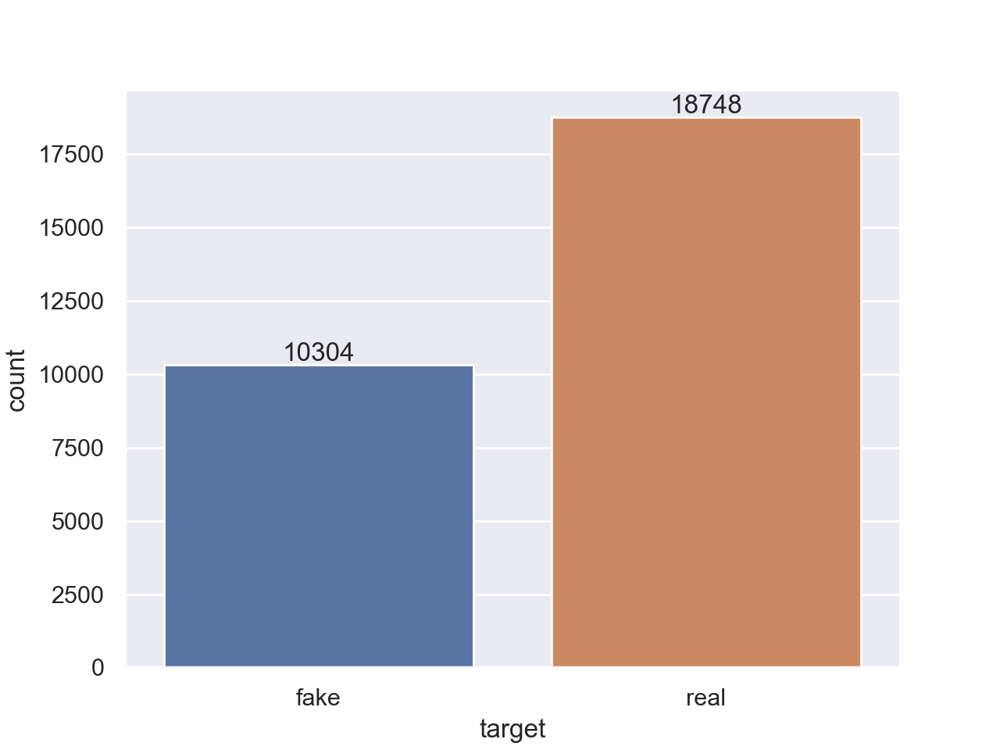

In [18]:
# check balance - make need to balance in modeling
ax=sns.countplot(x="target", data=tweet_data)
for p in ax.patches:
    ax.annotate("%.f" % p.get_height(), xy=(p.get_x()+p.get_width()/2, p.get_height()),
            xytext=(0, 5), textcoords='offset points', ha="center", va="center");

### General EDA

#### Article Length

In [20]:
# get word count
tweet_data['num_words'] = tweet_data["text"].apply(lambda x: len(x.split()))

tweet_data.head()

,id,title,text,source,target,num_words
0,buzzfeed,Proof The Mainstream Media Is Manipulating The...,I woke up this morning to find a variation of ...,www.addictinginfo.org,fake,532
1,buzzfeed,Charity: Clinton Foundation Distributed “Water...,Former President Bill Clinton and his Clinton ...,eaglerising.com,fake,1348
2,buzzfeed,A Hillary Clinton Administration May be Entire...,After collapsing just before trying to step in...,eaglerising.com,fake,599
3,buzzfeed,Trump’s Latest Campaign Promise May Be His Mos...,"Donald Trump is, well, deplorable. He’s sugges...",www.addictinginfo.org,fake,738
4,buzzfeed,Website is Down For Maintenance,Website is Down For Maintenance,www.proudcons.com,fake,5


In [21]:
# average article length
print('Real average article length:', tweet_data[tweet_data['target']=='real']['num_words'].mean())
print('Fake average article length:', tweet_data[tweet_data['target']=='fake']['num_words'].mean())

Real average article length: 519.7404523149136
Fake average article length: 317.75291149068323


<IPython.core.display.Javascript object>


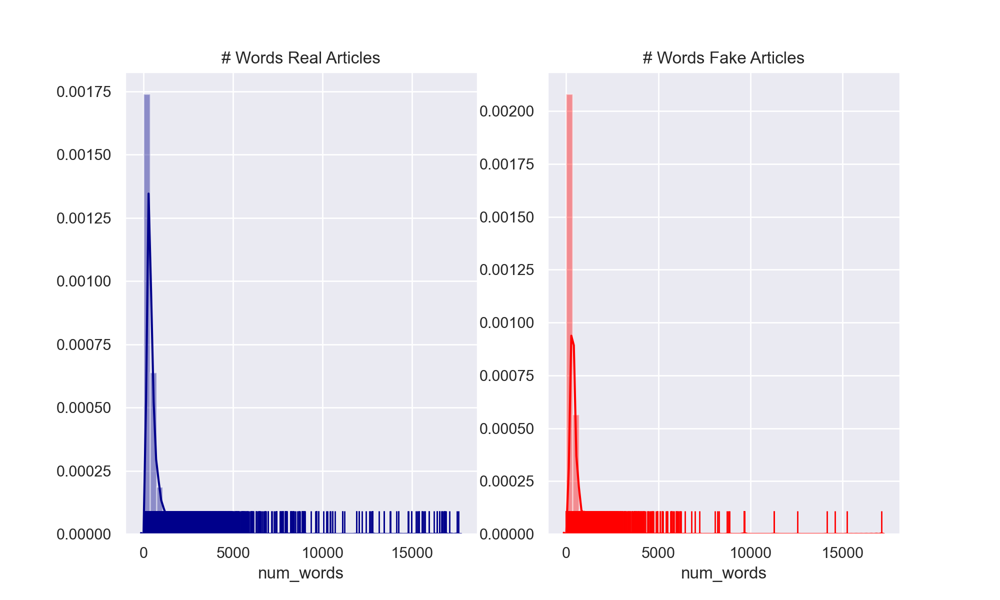

In [22]:
# plot word count distribution real/fake
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(tweet_data[tweet_data['target']=='real']['num_words'], 
             ax = ax[0], color = "darkblue", rug = True).set_title("# Words Real Articles")
sns.distplot(tweet_data[tweet_data['target']=='fake']['num_words'],
             ax = ax[1], color = "red", rug = True).set_title("# Words Fake Articles");

#### Character Count

<IPython.core.display.Javascript object>


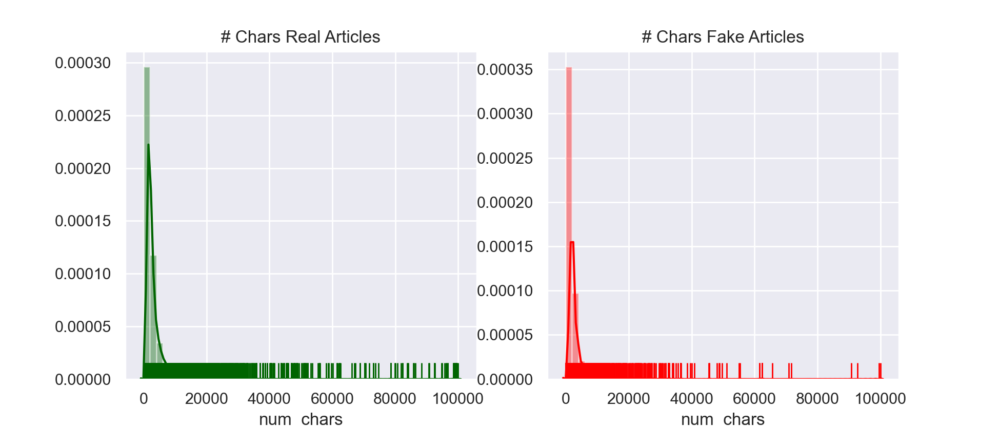

In [27]:
# real/fake character count
tweet_data['num_chars'] = tweet_data["text"].apply(lambda x: len(x))
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(tweet_data[tweet_data['target']=='real']['num_chars'], 
             ax = ax[0], color = "darkgreen", rug = True).set_title("# Chars Real Articles")
sns.distplot(tweet_data[tweet_data['target']=='fake']['num_chars'],
             ax = ax[1], color = "red", rug = True).set_title("# Chars Fake Articles");

In [167]:
# quotation marks
print('Real \" count:', tweet_data[tweet_data['target']=='real']['text'].str.count("\"").sum())
print('Fake \" count:', tweet_data[tweet_data['target']=='fake']['text'].str.count("\"").sum())

print('Real \' count:', tweet_data[tweet_data['target']=='real']['text'].str.count("\'").sum())
print('Fake \' count:', tweet_data[tweet_data['target']=='fake']['text'].str.count("\'").sum())

Real " count: 110613
Fake " count: 33014
Real ' count: 154490
Fake ' count: 42728


In [168]:
# quotations in text and title by target
tweet_data["num_quote"] = tweet_data["text"].str.count("\"")
tweet_data["num_quote_title"] = tweet_data["title"].str.count("\"")

quote_counts = tweet_data.groupby(['target'])[['num_quote']].sum().reset_index()
quote_counts

,target,num_quote
0,fake,33014
1,real,110613


In [216]:
tweet_data.groupby(['target'])[['num_quote_title']].sum().reset_index()

,target,num_quote_title
0,fake,236
1,real,763


In [186]:
tweet_data.groupby(['target'])[['num_quote']].mean()

,num_quote
target,
fake,3.203998
real,5.899989


In [187]:
tweet_data.groupby(['target'])[['num_quote_title']].mean()

,num_quote_title
target,
fake,0.022904
real,0.040698


<IPython.core.display.Javascript object>


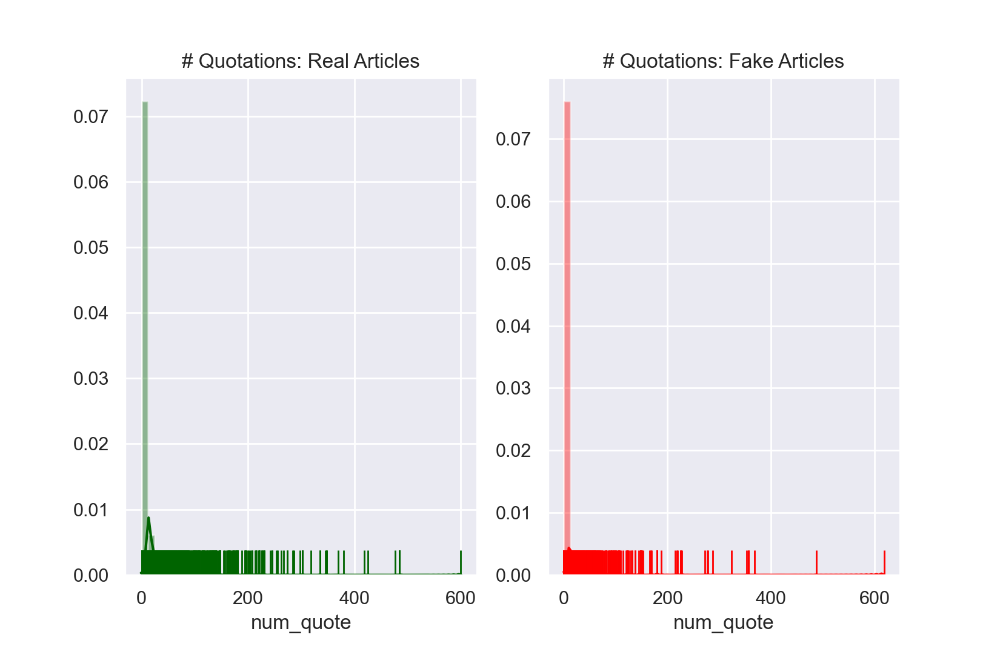

In [169]:
# real/fake character count - quote
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(tweet_data[tweet_data['target']=='real']['num_quote'], 
             ax = ax[0], color = "darkgreen", rug = True).set_title("# Quotations: Real Articles")
sns.distplot(tweet_data[tweet_data['target']=='fake']['num_quote'],
             ax = ax[1], color = "red", rug = True).set_title("# Quotations: Fake Articles");

<IPython.core.display.Javascript object>


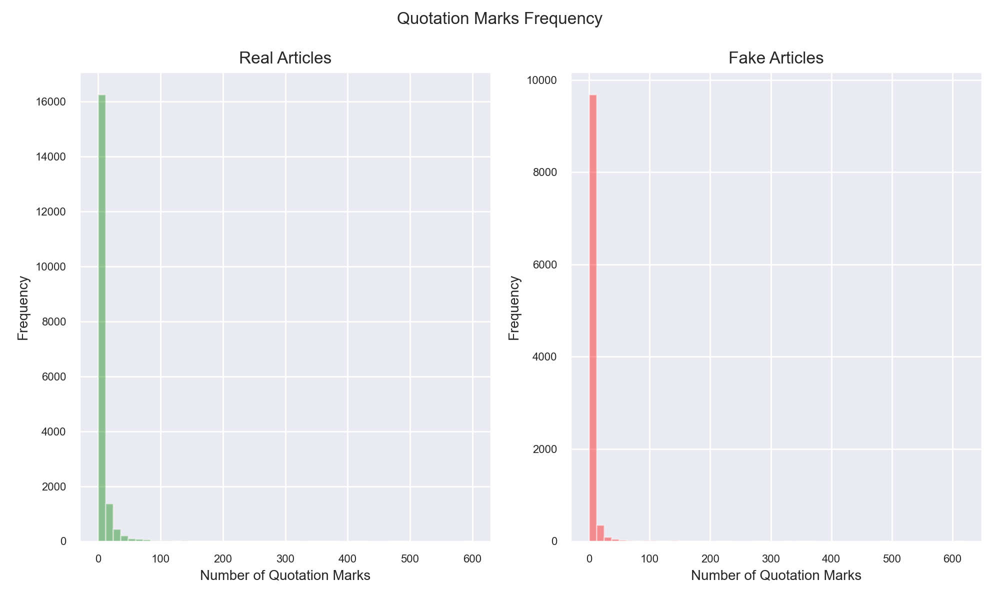

In [215]:
# plot word count distribution real/fake
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(tweet_data[tweet_data['target']=='real']['num_quote'], 
             ax = ax[0], color = "green", kde=False).set_title("Real Articles")
sns.distplot(tweet_data[tweet_data['target']=='fake']['num_quote'],
             ax = ax[1], color = "red", kde=False).set_title("Fake Articles")

fig.suptitle("Quotation Marks Frequency", fontsize=12)
ax[0].set_xlabel('Number of Quotation Marks', fontsize=10)
ax[0].set_ylabel('Frequency', fontsize=10)
ax[0].tick_params(axis='x', labelsize=8) 
ax[0].tick_params(axis='y', labelsize=8)
ax[1].set_xlabel('Number of Quotation Marks', fontsize=10)
ax[1].set_ylabel('Frequency', fontsize=10)
ax[1].tick_params(axis='x', labelsize=8) 
ax[1].tick_params(axis='y', labelsize=8)

fig.tight_layout()
fig.subplots_adjust(top=0.88);

In [170]:
from sklearn.utils import resample 

# undersample
df_majority = tweet_data[tweet_data.target=='real']
df_minority = tweet_data[tweet_data.target=='fake']

df_majority_downsampled = resample(df_majority, replace=False, n_samples=10304, random_state=123)

df_balance = pd.concat([df_majority_downsampled, df_minority])
df_balance['target'].value_counts()

quote_counts = df_balance.groupby(['target'])[['num_quote']].sum().reset_index()
quote_counts

,target,num_quote
0,fake,33014
1,real,59625


<IPython.core.display.Javascript object>


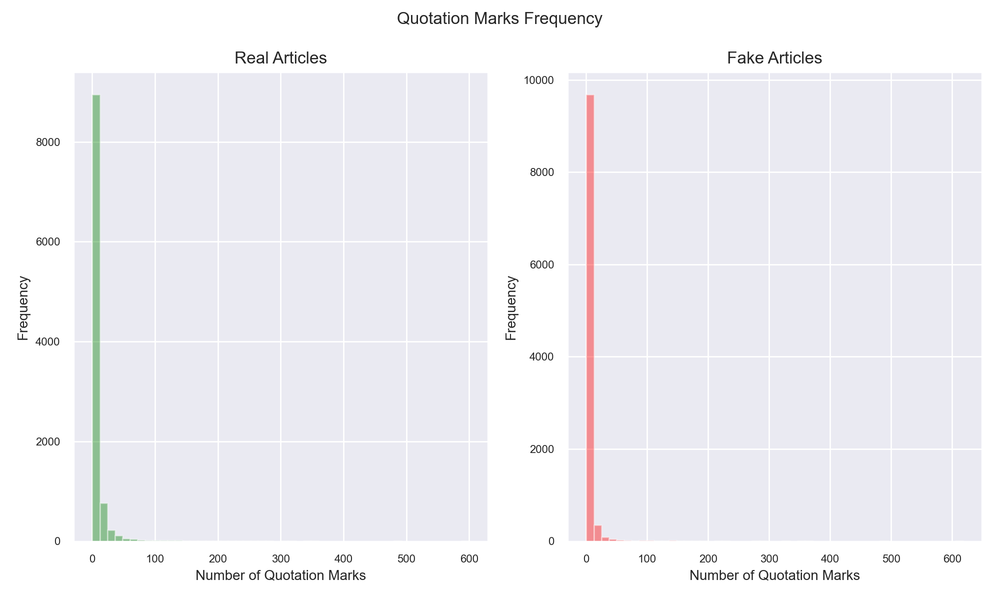

In [214]:
# plot word count distribution real/fake
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(df_balance[df_balance['target']=='real']['num_quote'], 
             ax = ax[0], color = "green", kde=False).set_title("Real Articles")
sns.distplot(df_balance[df_balance['target']=='fake']['num_quote'],
             ax = ax[1], color = "red", kde=False).set_title("Fake Articles")

fig.suptitle("Quotation Marks Frequency", fontsize=12)
ax[0].set_xlabel('Number of Quotation Marks', fontsize=10)
ax[0].set_ylabel('Frequency', fontsize=10)
ax[0].tick_params(axis='x', labelsize=8) 
ax[0].tick_params(axis='y', labelsize=8)
ax[1].set_xlabel('Number of Quotation Marks', fontsize=10)
ax[1].set_ylabel('Frequency', fontsize=10)
ax[1].tick_params(axis='x', labelsize=8) 
ax[1].tick_params(axis='y', labelsize=8)

fig.tight_layout()
fig.subplots_adjust(top=0.88);

In [171]:
# quotes
df_balance.groupby(['target'])[['num_quote_title']].sum()

,num_quote_title
target,
fake,236
real,403


In [149]:
# exclamation points
print('Real ! count:', tweet_data[tweet_data['target']=='real']['text'].str.count("!").sum())
print('Fake ! count:', tweet_data[tweet_data['target']=='fake']['text'].str.count("!").sum())

Real ! count: 23198
Fake ! count: 9794


In [154]:
# exclamations in text and title by target
tweet_data["num_excl"] = tweet_data["text"].str.count("!")
tweet_data["num_excl_title"] = tweet_data["title"].str.count("!")

ex_counts = tweet_data.groupby(['target'])[['num_excl']].sum().reset_index()
ex_counts

,target,num_excl
0,fake,9794
1,real,23198


In [184]:
tweet_data.groupby(['target'])[['num_excl']].mean()

,num_excl
target,
fake,0.950505
real,1.237359


In [218]:
tweet_data.groupby(['target'])[['num_excl_title']].sum()

,num_excl_title
target,
fake,437
real,768


In [185]:
tweet_data.groupby(['target'])[['num_excl_title']].mean()

,num_excl_title
target,
fake,0.042411
real,0.040964


<IPython.core.display.Javascript object>


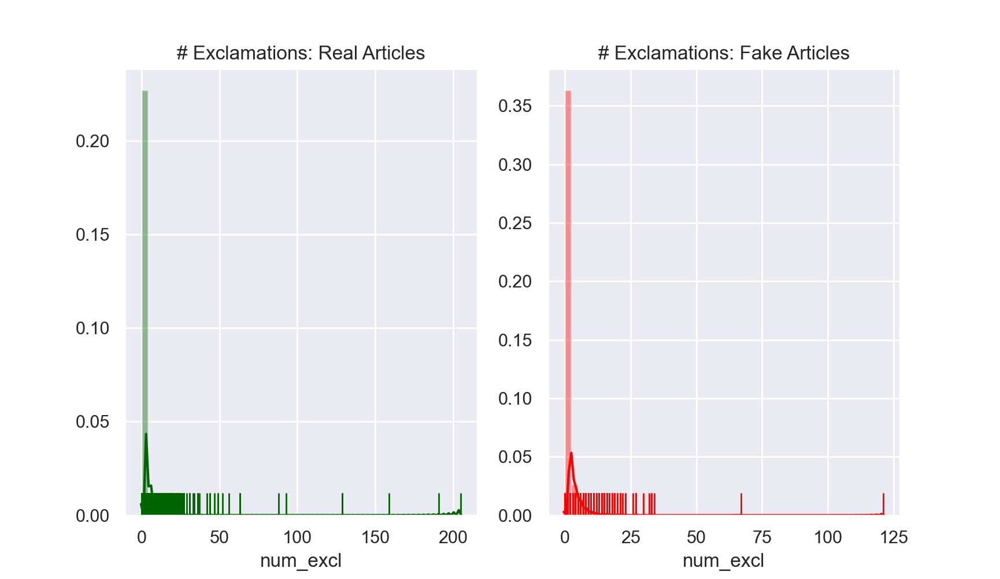

In [153]:
# real/fake character count - excl
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(tweet_data[tweet_data['target']=='real']['num_excl'], 
             ax = ax[0], color = "darkgreen", rug = True).set_title("# Exclamations: Real Articles")
sns.distplot(tweet_data[tweet_data['target']=='fake']['num_excl'],
             ax = ax[1], color = "red", rug = True).set_title("# Exclamations: Fake Articles");

In [155]:
from sklearn.utils import resample

# undersample
df_majority = tweet_data[tweet_data.target=='real']
df_minority = tweet_data[tweet_data.target=='fake']

df_majority_downsampled = resample(df_majority, replace=False, n_samples=10304, random_state=123)

df_balance = pd.concat([df_majority_downsampled, df_minority])
df_balance['target'].value_counts()

real    10304
fake    10304
Name: target, dtype: int64

<IPython.core.display.Javascript object>


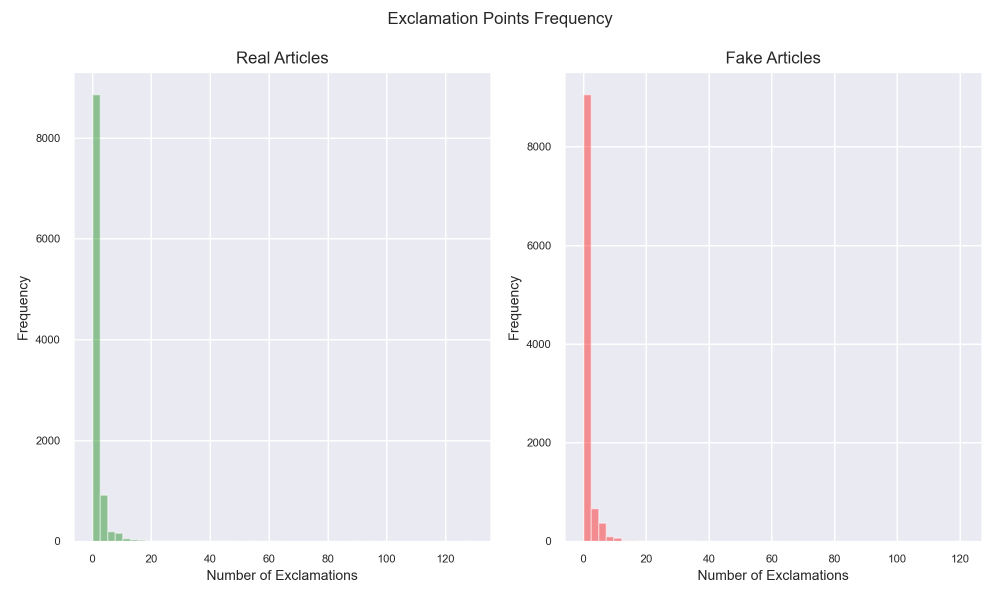

In [213]:
# plot word count distribution real/fake
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(df_balance[df_balance['target']=='real']['num_excl'], 
             ax = ax[0], color = "green", kde=False).set_title("Real Articles")
sns.distplot(df_balance[df_balance['target']=='fake']['num_excl'],
             ax = ax[1], color = "red", kde=False).set_title("Fake Articles")

fig.suptitle("Exclamation Points Frequency", fontsize=12)
ax[0].set_xlabel('Number of Exclamations', fontsize=10)
ax[0].set_ylabel('Frequency', fontsize=10)
ax[0].tick_params(axis='x', labelsize=8) 
ax[0].tick_params(axis='y', labelsize=8)
ax[1].set_xlabel('Number of Exclamations', fontsize=10)
ax[1].set_ylabel('Frequency', fontsize=10)
ax[1].tick_params(axis='x', labelsize=8) 
ax[1].tick_params(axis='y', labelsize=8)

fig.tight_layout()
fig.subplots_adjust(top=0.88);

In [156]:
ex_counts = df_balance.groupby(['target'])[['num_excl']].sum().reset_index()
ex_counts

,target,num_excl
0,fake,9794
1,real,12443


In [157]:
df_balance.groupby(['target'])[['num_excl_title']].sum()

,num_excl_title
target,
fake,437
real,426


#### Title Length

In [54]:
# title length
tweet_data['num_words_title'] = tweet_data["title"].apply(lambda x: len(x.split()))

# average title length
print('Real average article length:', tweet_data[tweet_data['target']=='real']['num_words_title'].mean())
print('Fake average article length:', tweet_data[tweet_data['target']=='fake']['num_words_title'].mean())

Real average article length: 9.09206315340303
Fake average article length: 6.462053571428571


<IPython.core.display.Javascript object>


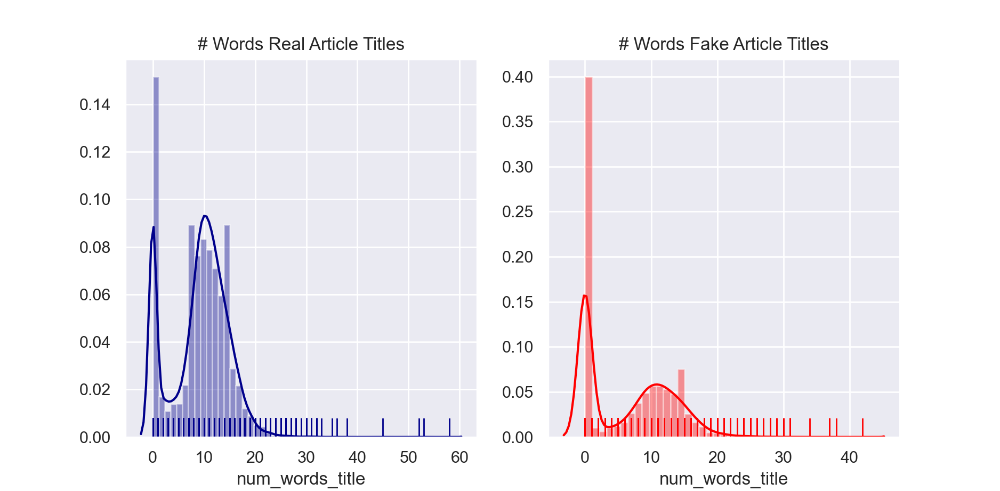

In [55]:
# plot title word count distribution real/fake
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(tweet_data[tweet_data['target']=='real']['num_words_title'], 
             ax = ax[0], color = "darkblue", rug = True).set_title("# Words Real Article Titles")
sns.distplot(tweet_data[tweet_data['target']=='fake']['num_words_title'],
             ax = ax[1], color = "red", rug = True).set_title("# Words Fake Article Titles");

In [188]:
df_balance.groupby(['target'])[['num_words_title']].sum()

,num_words_title
target,
fake,66585
real,93722


In [189]:
df_balance.groupby(['target'])[['num_words_title']].mean()

,num_words_title
target,
fake,6.462054
real,9.095691


#### Article Source

In [24]:
# number of blank sources
tweet_data[tweet_data['source']==''].shape

(7638, 6)

In [32]:
# clean up source field
source_strip = lambda x: x["source"].split(',')[0].replace('https://', '').replace('http://', '').strip()
tweet_data["source2"] = tweet_data.apply(source_strip, axis=1)

In [33]:
# unique sources
len(list(set(tweet_data[tweet_data['source2']!='']['source'])))

2571

<IPython.core.display.Javascript object>


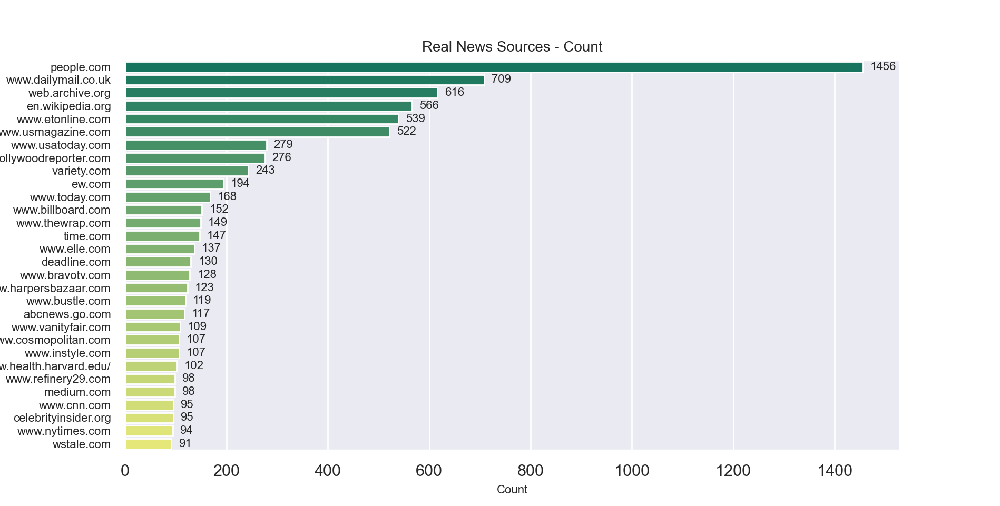

In [34]:
# count of real sources
real_order=tweet_data[(tweet_data['target']=='real') & (tweet_data['source2']!='')]['source2'].value_counts().sort_values(ascending=False).iloc[:30].index
ax=sns.countplot(data=tweet_data[(tweet_data['target']=='real') & (tweet_data['source2']!='')], y='source2', 
              order=real_order,
              palette='summer')
ax.set_title('Real News Sources - Count',fontsize=10)
ax.yaxis.set_tick_params(labelsize=8)
ax.set_xlabel('Count', fontsize=8)
ax.set_ylabel('Source',fontsize=8)

for p in ax.patches:
    ax.annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8);

<IPython.core.display.Javascript object>


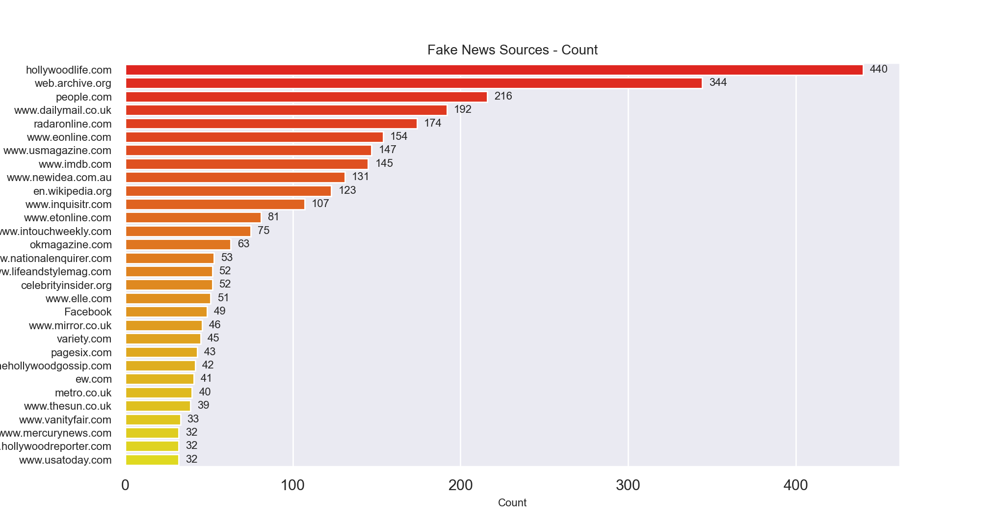

In [35]:
# count of fake sources
fake_order=tweet_data[(tweet_data['target']=='fake') & (tweet_data['source2']!='')]['source2'].value_counts().sort_values(ascending=False).iloc[:30].index
ax=sns.countplot(data=tweet_data[(tweet_data['target']=='fake') & (tweet_data['source2']!='')], y='source2', 
              order=fake_order,
              palette='autumn')
ax.set_title('Fake News Sources - Count',fontsize=10)
ax.yaxis.set_tick_params(labelsize=8)
ax.set_xlabel('Count', fontsize=8)
ax.set_ylabel('Source',fontsize=8)

for p in ax.patches:
    ax.annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8);

In [36]:
# find common sources between real/fake
fake_source = set(tweet_data[(tweet_data['target']=='fake') & (tweet_data['source2']!='')]['source2'])
real_source = set(tweet_data[(tweet_data['target']=='real') & (tweet_data['source2']!='')]['source2'])

common_source = list(fake_source.intersection(real_source))
len(common_source)

393

<IPython.core.display.Javascript object>


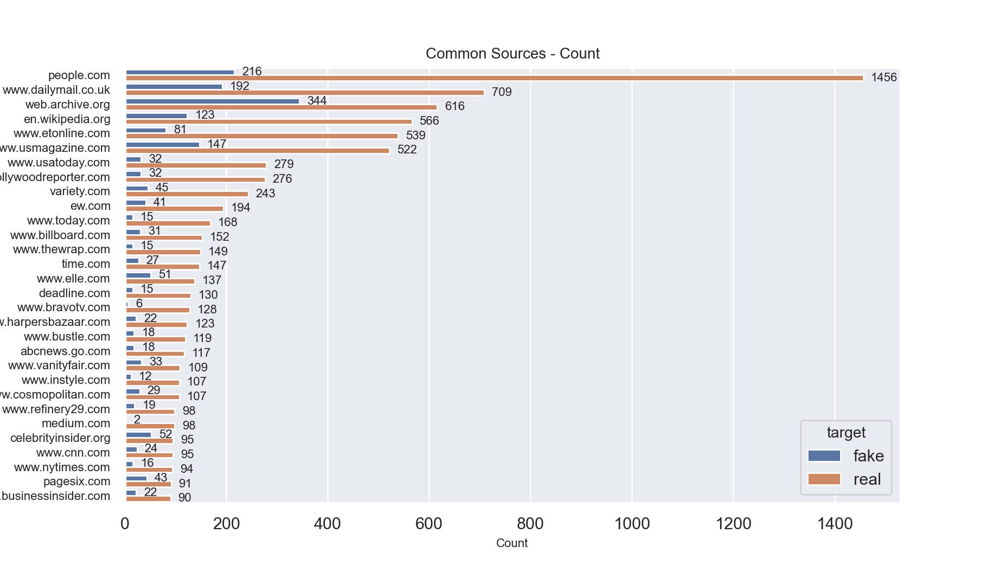

In [37]:
# plot common sources
common_order=tweet_data[(tweet_data['target']=='real') & (tweet_data['source2'].isin(common_source))]['source2'].value_counts().sort_values(ascending=False).iloc[:30].index
ax=sns.countplot(data=tweet_data[tweet_data['source2'].isin(common_source)], 
                 y='source2', hue="target",
              order=common_order)
ax.set_title('Common Sources - Count',fontsize=10)
ax.yaxis.set_tick_params(labelsize=8)
ax.set_xlabel('Count', fontsize=8)
ax.set_ylabel('Source',fontsize=8)

for p in ax.patches:
    ax.annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8);

<IPython.core.display.Javascript object>


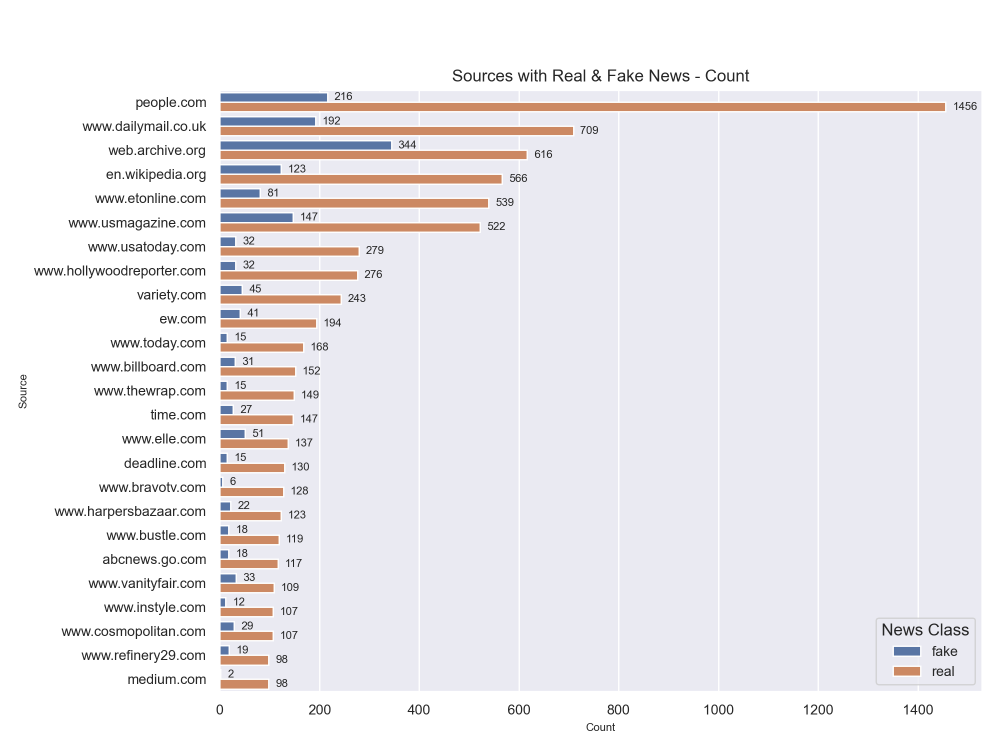

In [219]:
fig, ax = plt.subplots(1, 1, figsize=(10, 7.5))
sns.countplot(data=tweet_data[tweet_data['source2'].isin(common_source)], 
                 y='source2', hue="target",ax=ax,
              order=common_order[:25])

ax.set_title('Sources with Real & Fake News - Count',fontsize=12)
ax.yaxis.set_tick_params(labelsize=10)
ax.xaxis.set_tick_params(labelsize=10)
ax.set_xlabel('Count', fontsize=8)
ax.set_ylabel('Source',fontsize=8)
ax.legend(title='News Class', title_fontsize=12, prop=dict(size=10))

for p in ax.patches:
    ax.annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8)
    
fig.tight_layout()
fig.subplots_adjust(top=0.88);

#### Text Preprocessing
Remove strip extra spaces, punctuation, lower-case

In [38]:
# get stop words
import gensim
from nltk.corpus import stopwords
from gensim.parsing.preprocessing import STOPWORDS

In [48]:
# remove url and html tag from text, emoji
# from: https://www.kaggle.com/shahules/basic-eda-cleaning-and-glove#Data-Cleaning
def remove_URL(text):
    url = re.compile(r'https?://\S+|www\.\S+')
    return url.sub(r'',text)

def remove_html(text):
    html=re.compile(r'<.*?>')
    return html.sub(r'',text)

def remove_emoji(text):
    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F"  # emoticons
                           u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                           u"\U0001F680-\U0001F6FF"  # transport & map symbols
                           u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)

# clean text field
tweet_data['clean_text']=tweet_data['text'].apply(lambda x : remove_URL(x))
tweet_data['clean_text']=tweet_data['clean_text'].apply(lambda x : remove_html(x))
tweet_data['clean_text']=tweet_data['clean_text'].apply(lambda x : remove_emoji(x))
tweet_data.head()

,id,title,text,source,target,num_words,num_chars,source2,clean_text
0,buzzfeed,Proof The Mainstream Media Is Manipulating The...,I woke up this morning to find a variation of ...,www.addictinginfo.org,fake,532,3218,www.addictinginfo.org,I woke up this morning to find a variation of ...
1,buzzfeed,Charity: Clinton Foundation Distributed “Water...,Former President Bill Clinton and his Clinton ...,eaglerising.com,fake,1348,8837,eaglerising.com,Former President Bill Clinton and his Clinton ...
2,buzzfeed,A Hillary Clinton Administration May be Entire...,After collapsing just before trying to step in...,eaglerising.com,fake,599,3471,eaglerising.com,After collapsing just before trying to step in...
3,buzzfeed,Trump’s Latest Campaign Promise May Be His Mos...,"Donald Trump is, well, deplorable. He’s sugges...",www.addictinginfo.org,fake,738,4454,www.addictinginfo.org,"Donald Trump is, well, deplorable. He’s sugges..."
4,buzzfeed,Website is Down For Maintenance,Website is Down For Maintenance,www.proudcons.com,fake,5,31,www.proudcons.com,Website is Down For Maintenance


In [52]:
# strip spaces and punctuation and lower case
tweet_data["clean_text"] = tweet_data["clean_text"].str.strip()
tweet_data["clean_text"] = tweet_data["clean_text"].str.replace('[^ a-zA-Z]', '')
tweet_data["clean_text"] = tweet_data["clean_text"].str.replace('[^\w\s]','')
tweet_data["clean_text"] = tweet_data["clean_text"].str.lower()
tweet_data.head()

,id,title,text,source,target,num_words,num_chars,source2,clean_text
0,buzzfeed,Proof The Mainstream Media Is Manipulating The...,I woke up this morning to find a variation of ...,www.addictinginfo.org,fake,532,3218,www.addictinginfo.org,i woke up this morning to find a variation of ...
1,buzzfeed,Charity: Clinton Foundation Distributed “Water...,Former President Bill Clinton and his Clinton ...,eaglerising.com,fake,1348,8837,eaglerising.com,former president bill clinton and his clinton ...
2,buzzfeed,A Hillary Clinton Administration May be Entire...,After collapsing just before trying to step in...,eaglerising.com,fake,599,3471,eaglerising.com,after collapsing just before trying to step in...
3,buzzfeed,Trump’s Latest Campaign Promise May Be His Mos...,"Donald Trump is, well, deplorable. He’s sugges...",www.addictinginfo.org,fake,738,4454,www.addictinginfo.org,donald trump is well deplorable hes suggested ...
4,buzzfeed,Website is Down For Maintenance,Website is Down For Maintenance,www.proudcons.com,fake,5,31,www.proudcons.com,website is down for maintenance


In [53]:
# strip spaces and punctuation and lower case - clean title field as well
tweet_data['clean_title']=tweet_data['title'].apply(lambda x : remove_URL(x))
tweet_data['clean_title']=tweet_data['clean_title'].apply(lambda x : remove_html(x))
tweet_data['clean_title']=tweet_data['clean_title'].apply(lambda x : remove_emoji(x))
tweet_data["clean_title"] = tweet_data["clean_title"].str.strip()
tweet_data["clean_title"] = tweet_data["clean_title"].str.replace('[^ a-zA-Z]', '')
tweet_data["clean_title"] = tweet_data["clean_title"].str.replace('[^\w\s]','')
tweet_data["clean_title"] = tweet_data["clean_title"].str.lower()
tweet_data.head()

,id,title,text,source,target,num_words,num_chars,source2,clean_text,clean_title
0,buzzfeed,Proof The Mainstream Media Is Manipulating The...,I woke up this morning to find a variation of ...,www.addictinginfo.org,fake,532,3218,www.addictinginfo.org,i woke up this morning to find a variation of ...,proof the mainstream media is manipulating the...
1,buzzfeed,Charity: Clinton Foundation Distributed “Water...,Former President Bill Clinton and his Clinton ...,eaglerising.com,fake,1348,8837,eaglerising.com,former president bill clinton and his clinton ...,charity clinton foundation distributed watered...
2,buzzfeed,A Hillary Clinton Administration May be Entire...,After collapsing just before trying to step in...,eaglerising.com,fake,599,3471,eaglerising.com,after collapsing just before trying to step in...,a hillary clinton administration may be entire...
3,buzzfeed,Trump’s Latest Campaign Promise May Be His Mos...,"Donald Trump is, well, deplorable. He’s sugges...",www.addictinginfo.org,fake,738,4454,www.addictinginfo.org,donald trump is well deplorable hes suggested ...,trumps latest campaign promise may be his most...
4,buzzfeed,Website is Down For Maintenance,Website is Down For Maintenance,www.proudcons.com,fake,5,31,www.proudcons.com,website is down for maintenance,website is down for maintenance


#### Word Clouds
Look at stop words from multiple packages - `ntlk` and `gensim`

In [56]:
from wordcloud import WordCloud

In [57]:
# stop words
nltk_stop = set(stopwords.words('english'))
gensim_stop = set(STOPWORDS)

<IPython.core.display.Javascript object>


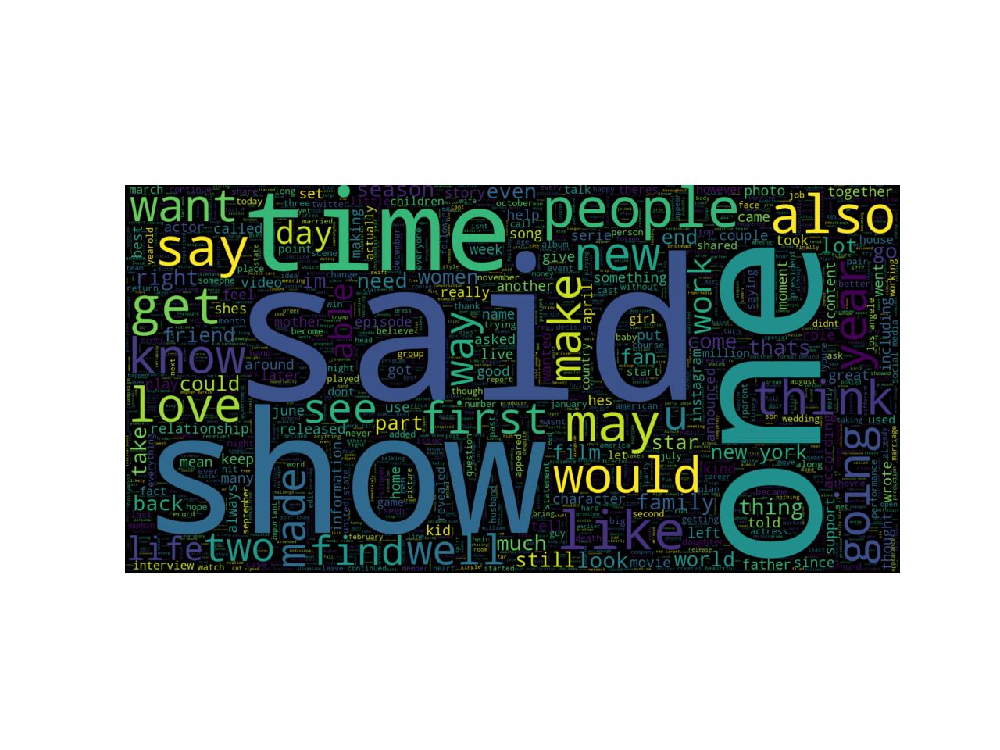

In [58]:
# word clouds - real - nltk
fig, ax = plt.subplots()
wc_real = WordCloud(max_words = 2000 , width = 1600 , height = 800 , 
                    stopwords = nltk_stop).generate(" ".join(tweet_data[tweet_data['target']=='real']['clean_text']))
ax.imshow(wc_real , interpolation = 'bilinear')
ax.axis('off');

<IPython.core.display.Javascript object>


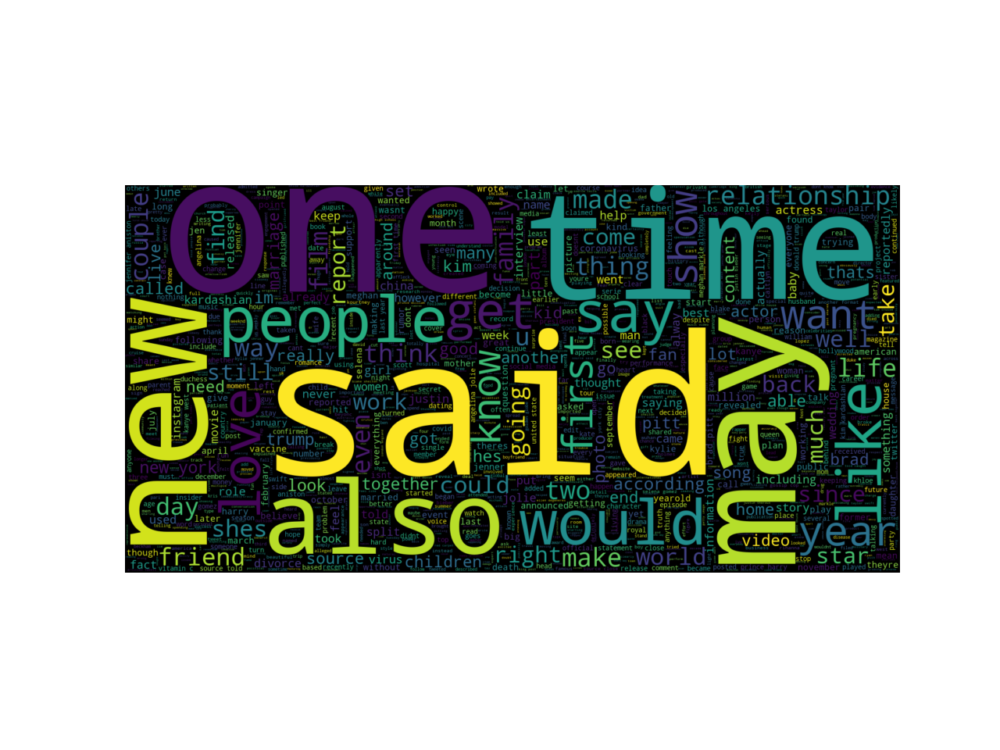

In [59]:
# word clouds - fake - nltk
fig, ax = plt.subplots()
wc_real = WordCloud(max_words = 2000 , width = 1600 , height = 800 , 
                    stopwords = nltk_stop).generate(" ".join(tweet_data[tweet_data['target']=='fake']['clean_text']))
ax.imshow(wc_real , interpolation = 'bilinear')
ax.axis('off');

<IPython.core.display.Javascript object>


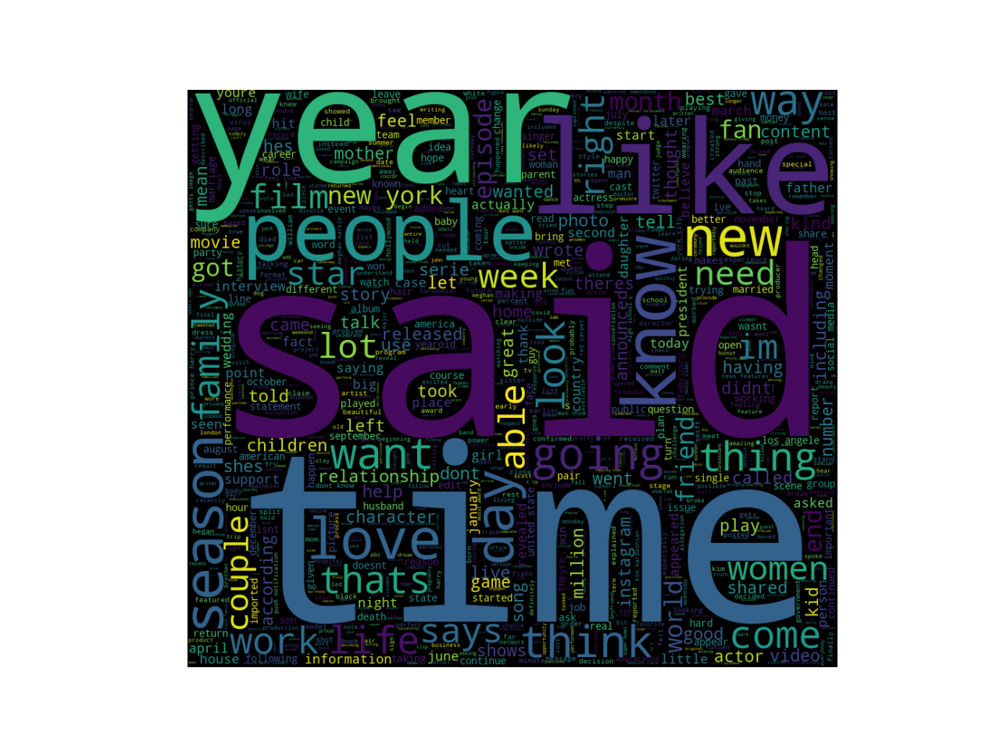

In [60]:
# word clouds - real - gensim
fig, ax = plt.subplots()
wc_real = WordCloud(max_words = 2000 , width = 900 , height = 800 , 
                    stopwords = gensim_stop).generate(" ".join(tweet_data[tweet_data['target']=='real']['clean_text']))
ax.imshow(wc_real , interpolation = 'bilinear')
ax.axis('off');

<IPython.core.display.Javascript object>


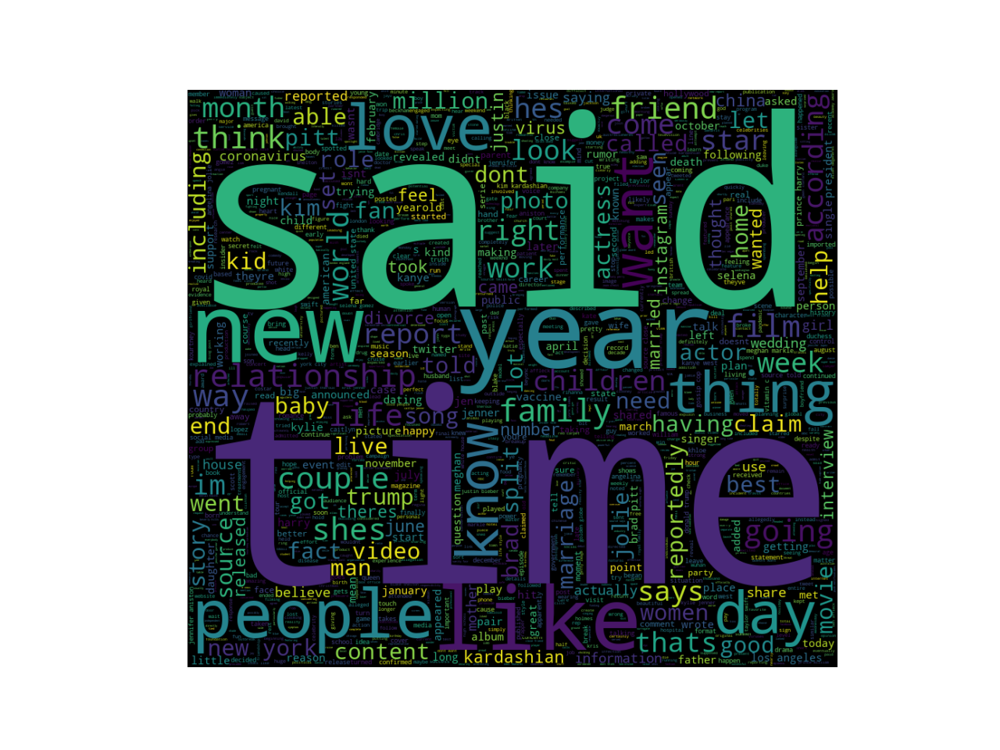

In [61]:
# word clouds - fake - gensim
fig, ax = plt.subplots()
wc_real = WordCloud(max_words = 2000 , width = 900 , height = 800 , 
                    stopwords = gensim_stop).generate(" ".join(tweet_data[tweet_data['target']=='fake']['clean_text']))
ax.imshow(wc_real , interpolation = 'bilinear')
ax.axis('off');

#### Additional Processing
Remove stop words, lemmatize, tokenize

In [62]:
# more text preprocessing packges
from nltk.stem import WordNetLemmatizer 
from nltk.tokenize import word_tokenize
from nltk.util import ngrams
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer

In [63]:
# remove stop words - gensim (seemed to be better)
tweet_data["clean_text2"] = tweet_data["clean_text"].apply(lambda x: ' '.join([word for word in x.split() if word not in (gensim_stop)]))
tweet_data.head()

,id,title,text,source,target,num_words,num_chars,source2,clean_text,clean_title,num_words_title,clean_text2
0,buzzfeed,Proof The Mainstream Media Is Manipulating The...,I woke up this morning to find a variation of ...,www.addictinginfo.org,fake,532,3218,www.addictinginfo.org,i woke up this morning to find a variation of ...,proof the mainstream media is manipulating the...,15,woke morning variation headline splashed news ...
1,buzzfeed,Charity: Clinton Foundation Distributed “Water...,Former President Bill Clinton and his Clinton ...,eaglerising.com,fake,1348,8837,eaglerising.com,former president bill clinton and his clinton ...,charity clinton foundation distributed watered...,13,president clinton clinton health access initia...
2,buzzfeed,A Hillary Clinton Administration May be Entire...,After collapsing just before trying to step in...,eaglerising.com,fake,599,3471,eaglerising.com,after collapsing just before trying to step in...,a hillary clinton administration may be entire...,14,collapsing trying step van removed ceremony ne...
3,buzzfeed,Trump’s Latest Campaign Promise May Be His Mos...,"Donald Trump is, well, deplorable. He’s sugges...",www.addictinginfo.org,fake,738,4454,www.addictinginfo.org,donald trump is well deplorable hes suggested ...,trumps latest campaign promise may be his most...,11,donald trump deplorable hes suggested building...
4,buzzfeed,Website is Down For Maintenance,Website is Down For Maintenance,www.proudcons.com,fake,5,31,www.proudcons.com,website is down for maintenance,website is down for maintenance,5,website maintenance


In [64]:
# tokenize and lemmatize text
lemmatizer = WordNetLemmatizer()  

def token_text(df):
    word_list = []
    for article in (df['clean_text2']):
        words = word_tokenize(article)
        words = [lemmatizer.lemmatize(word) for word in words]
        for w in words:
            word_list.append(w)
    return word_list
            
full_token = token_text(tweet_data)

In [65]:
# pickle list so don't have to run again
with open("full_token_tweet_data.txt", "wb") as fp:   
    pickle.dump(full_token, fp)

# unpickle 
#with open("full_token.txt", "rb") as fp:   
#    b = pickle.load(fp)

In [66]:
# tokenize for true and false news as well
true_token = token_text(tweet_data[tweet_data['target']=='real'])
false_token = token_text(tweet_data[tweet_data['target']=='fake'])

with open("true_token_tweet_data.txt", "wb") as fp:   
    pickle.dump(true_token, fp)
    
with open("false_token_tweet_data.txt", "wb") as fp:   
    pickle.dump(false_token, fp)

#### N-gram analysis
Look at unigram, bigram, trigram - for full text, real news, fake news

In [67]:
# nltk ngrams - a little slow
pd.Series(ngrams(full_token, 2)).value_counts()[:20]

(new, york)             6860
(los, angeles)          3670
(united, state)         3129
(social, medium)        2960
(able, information)     2639
(prince, harry)         2293
(feel, like)            2269
(dont, know)            2203
(information, web)      2042
(content, format)       2041
(format, able)          2041
(able, content)         2041
(content, imported)     2041
(york, city)            1922
(look, like)            1856
(meghan, markle)        1767
(news, feature)         1586
(push, notification)    1564
(notification, news)    1562
(kim, kardashian)       1543
dtype: int64

In [68]:
# top n-grams - kind of slow
def top_ngram(data, n=2, top=20):
    vector = CountVectorizer(ngram_range=(n, n)).fit(data)
    bow = vector.transform(data)
    sum_words = bow.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) 
                  for word, idx in vector.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:top]

In [69]:
# full text n gram
uni_full = top_ngram(full_token, 1)
bi_full = pd.Series(ngrams(full_token, 2)).value_counts()[:20]
tri_full = pd.Series(ngrams(full_token, 3)).value_counts()[:20]

<IPython.core.display.Javascript object>


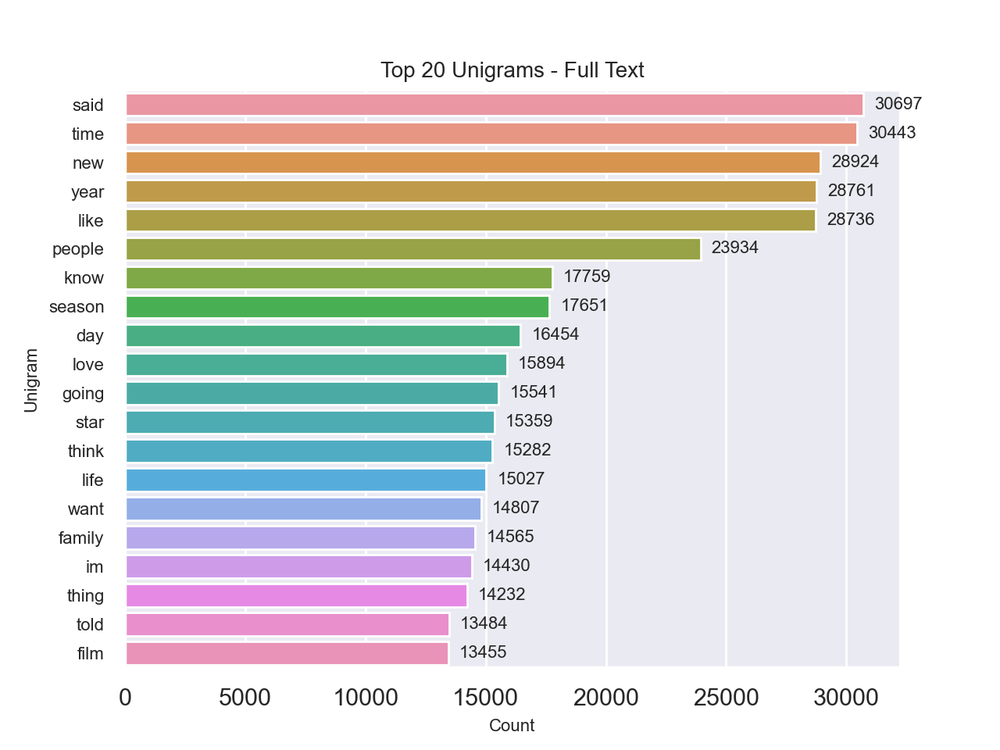

In [70]:
# full text unigram
x,y = map(list,zip(*uni_full))
ax=sns.barplot(x=y,y=x)
ax.set_title('Top 20 Unigrams - Full Text',fontsize=10)
ax.yaxis.set_tick_params(labelsize=8)
ax.set_xlabel('Count', fontsize=8)
ax.set_ylabel('Unigram',fontsize=8)

for p in ax.patches:
    ax.annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8);

In [71]:
uni_full[:4]

[('said', 30697), ('time', 30443), ('new', 28924), ('year', 28761)]

In [72]:
# plot top 20 n-grams function
def plot_ngram(ngram_list, text1, text2):
    ngram_df = ngram_list.to_frame().reset_index()
    ngram_df.columns = ['idx', 'count']
    tup_string = lambda x: ' '.join(x['idx'])
    ngram_df['words'] = ngram_df.apply(tup_string, axis=1)
    
    ax=sns.barplot(x='count',y='words', data=ngram_df)
    ax.set_title('Top 20 {}s - {} Text'.format(text1, text2),fontsize=10)
    ax.yaxis.set_tick_params(labelsize=8)
    ax.set_xlabel('Count', fontsize=8)
    ax.set_ylabel(text1 ,fontsize=8)

    for p in ax.patches:
        ax.annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8);

<IPython.core.display.Javascript object>


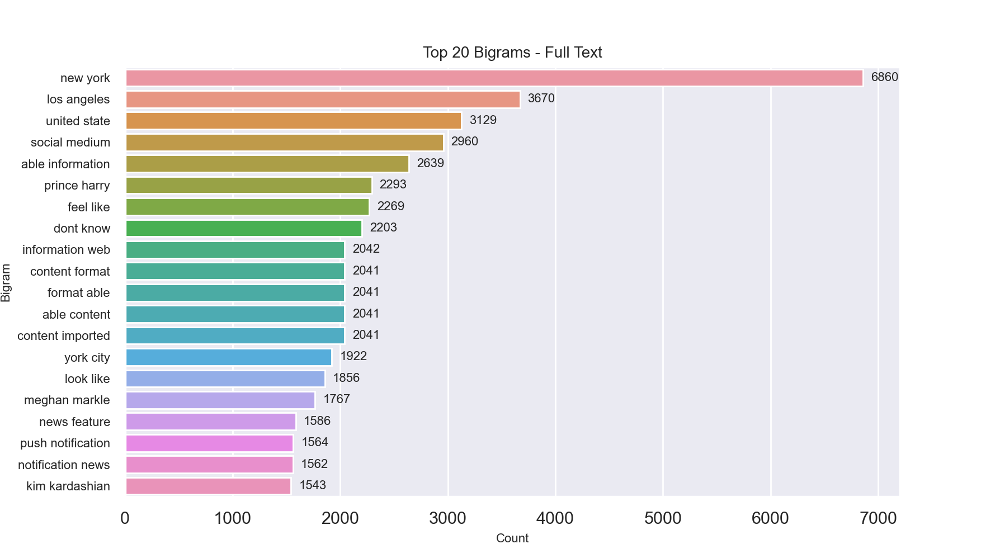

In [73]:
# full text bigram
plot_ngram(bi_full, 'Bigram', 'Full')

<IPython.core.display.Javascript object>


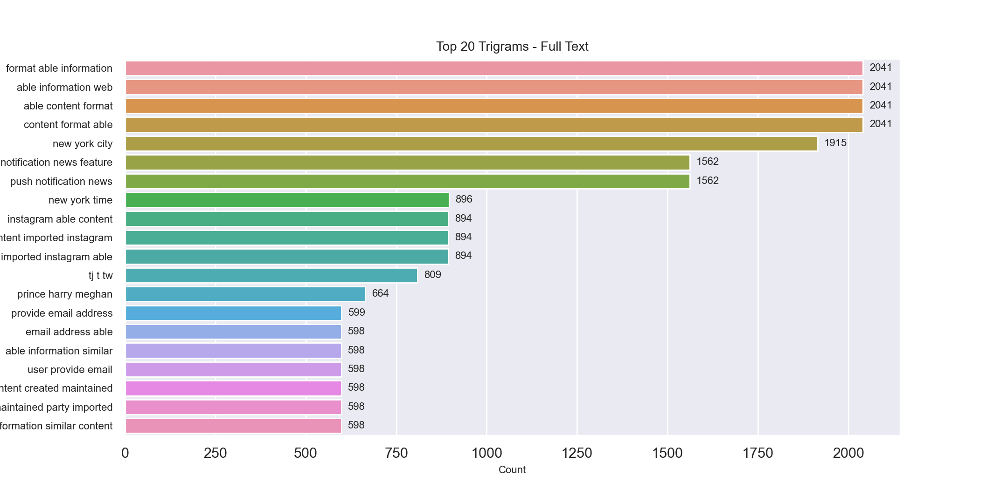

In [74]:
# full text trigram
plot_ngram(tri_full, 'Trigram', 'Full')

In [75]:
# true text n gram
uni_true = top_ngram(true_token, 1)
bi_true = pd.Series(ngrams(true_token, 2)).value_counts()[:20]
tri_true = pd.Series(ngrams(true_token, 3)).value_counts()[:20]

<IPython.core.display.Javascript object>


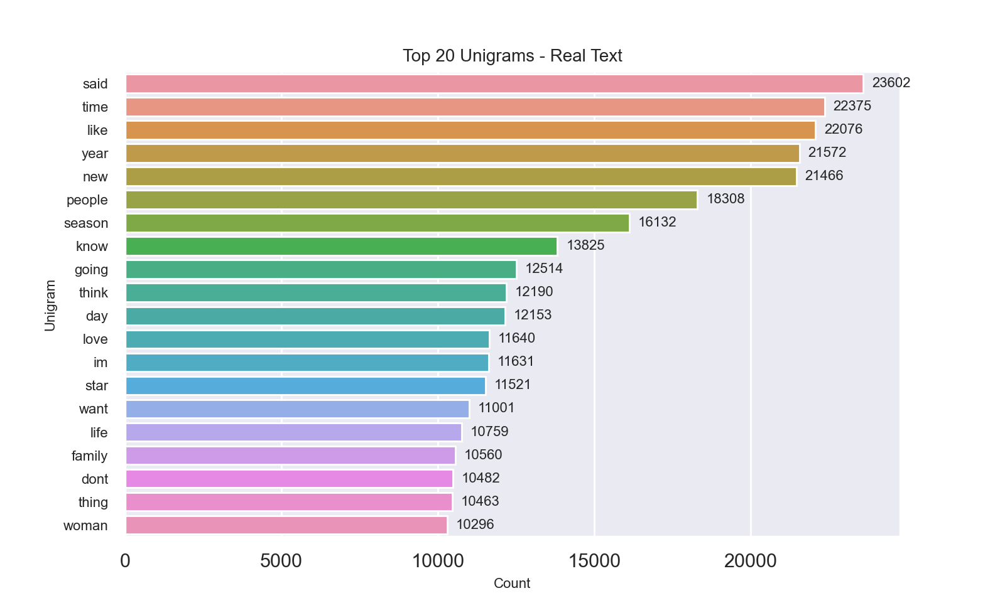

In [76]:
# real text unigram
x,y = map(list,zip(*uni_true))
ax=sns.barplot(x=y,y=x)
ax.set_title('Top 20 Unigrams - Real Text',fontsize=10)
ax.yaxis.set_tick_params(labelsize=8)
ax.set_xlabel('Count', fontsize=8)
ax.set_ylabel('Unigram',fontsize=8)

for p in ax.patches:
    ax.annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8);

<IPython.core.display.Javascript object>


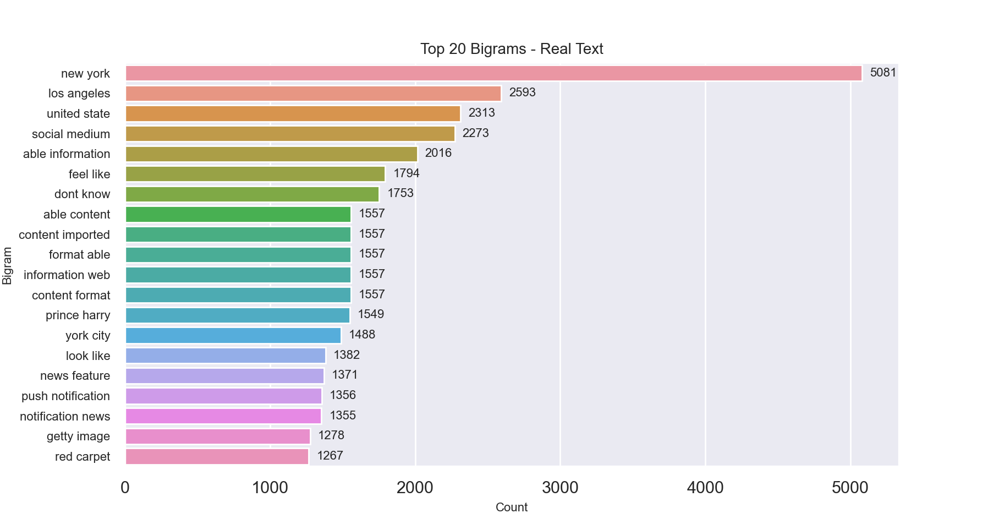

In [77]:
# true text bigram
plot_ngram(bi_true, 'Bigram', 'Real')

<IPython.core.display.Javascript object>


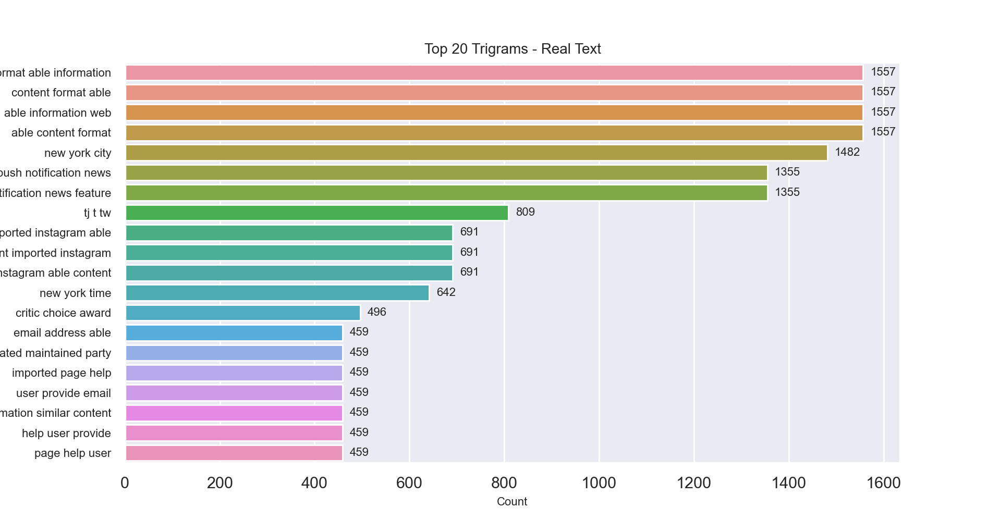

In [78]:
# true text trigram
plot_ngram(tri_true, 'Trigram', 'Real')

In [79]:
# false text n gram
uni_fake = top_ngram(false_token, 1)
bi_fake = pd.Series(ngrams(false_token, 2)).value_counts()[:20]
tri_fake = pd.Series(ngrams(false_token, 3)).value_counts()[:20]

<IPython.core.display.Javascript object>


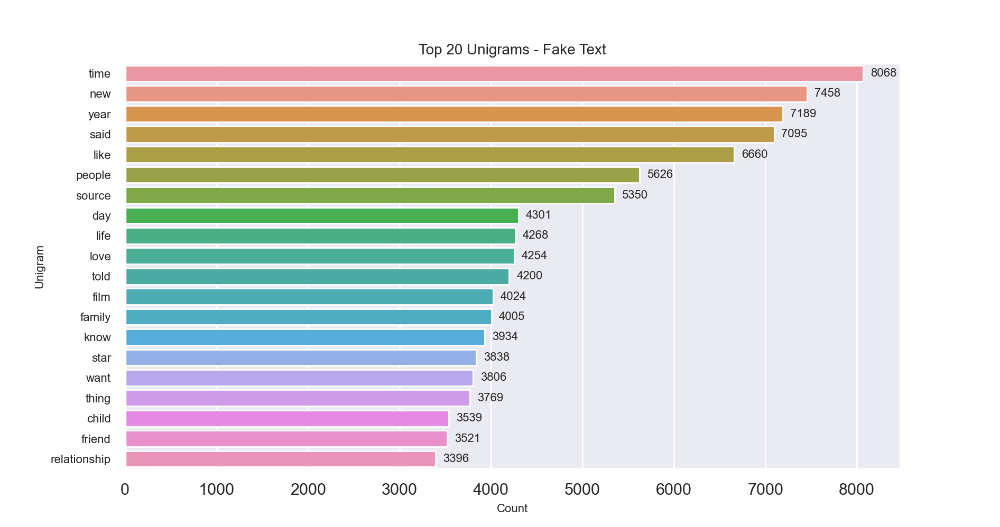

In [80]:
# fake text unigram
x,y = map(list,zip(*uni_fake))
ax=sns.barplot(x=y,y=x)
ax.set_title('Top 20 Unigrams - Fake Text',fontsize=10)
ax.yaxis.set_tick_params(labelsize=8)
ax.set_xlabel('Count', fontsize=8)
ax.set_ylabel('Unigram',fontsize=8)

for p in ax.patches:
    ax.annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8);

<IPython.core.display.Javascript object>


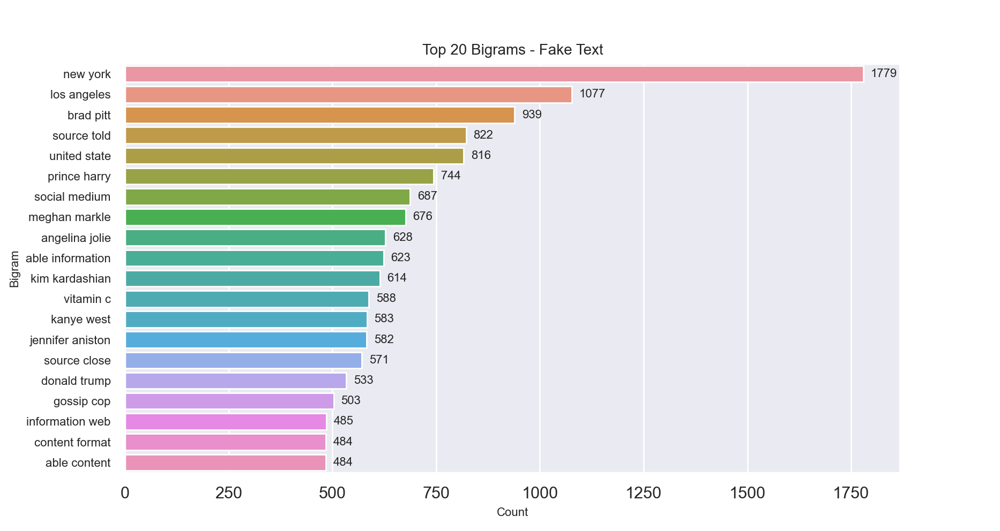

In [81]:
# fake text bigram
plot_ngram(bi_fake, 'Bigram', 'Fake')

<IPython.core.display.Javascript object>


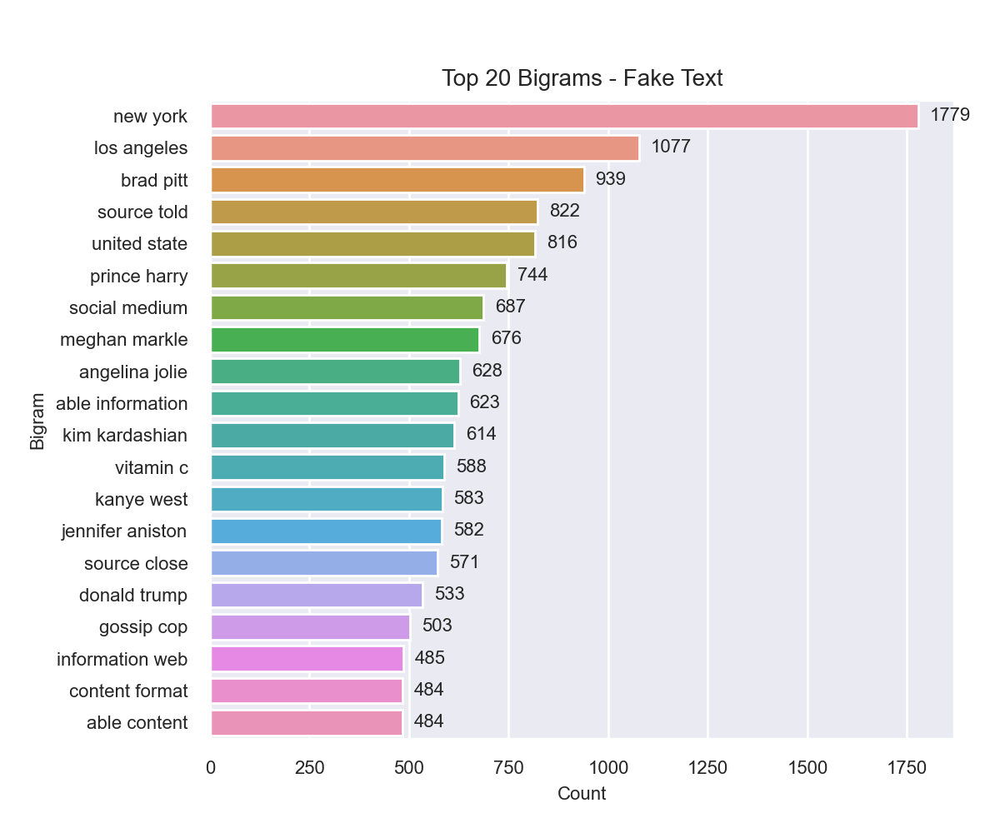

In [221]:
bigram_fake_df = bi_fake.to_frame().reset_index()
bigram_fake_df.columns = ['idx', 'count']
tup_string = lambda x: ' '.join(x['idx'])
bigram_fake_df['words'] = bigram_fake_df.apply(tup_string, axis=1)

fig, ax = plt.subplots(1, 1, figsize=(6,5))
sns.barplot(x='count',y='words', data=bigram_fake_df, ax=ax)
ax.set_title('Top 20 Bigrams - Fake Text',fontsize=10)
ax.yaxis.set_tick_params(labelsize=8)
ax.xaxis.set_tick_params(labelsize=8)
ax.set_xlabel('Count', fontsize=8)
ax.set_ylabel('Bigram',fontsize=8)

for p in ax.patches:
    ax.annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8)
    
fig.tight_layout()
fig.subplots_adjust(top=0.88);

<IPython.core.display.Javascript object>


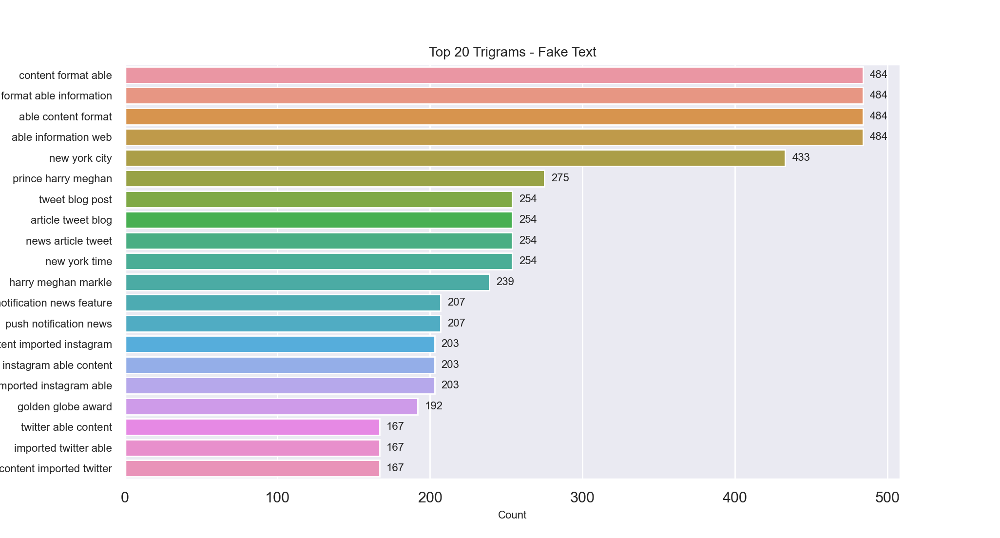

In [82]:
# fake text trigram
plot_ngram(tri_fake, 'Trigram', 'Fake')

#### Sentiment Analysis
Using multiple packages - `nltk` VADER, `textblob`

In [83]:
# load packages
from textblob import TextBlob
from nltk.sentiment.vader import SentimentIntensityAnalyzer

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/suryamenon/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/suryamenon/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/suryamenon/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [192]:
# nltk - vader sentiment
analyzer = SentimentIntensityAnalyzer()

# get positive, negative, neutral, compound scores
tweet_data['neg'] = tweet_data['clean_text2'].apply(lambda x:analyzer.polarity_scores(x)['neg'])
tweet_data['neu'] = tweet_data['clean_text2'].apply(lambda x:analyzer.polarity_scores(x)['neu'])
tweet_data['pos'] = tweet_data['clean_text2'].apply(lambda x:analyzer.polarity_scores(x)['pos'])
tweet_data['compound'] = tweet_data['clean_text2'].apply(lambda x:analyzer.polarity_scores(x)['compound'])
tweet_data.head()

,id,title,text,source,target,num_words,num_chars,source2,clean_text,clean_title,...,neg,neu,pos,compound,polarity,num_excl,num_excl_title,num_quote,num_quote_title,clean_title2
0,buzzfeed,Proof The Mainstream Media Is Manipulating The...,I woke up this morning to find a variation of ...,www.addictinginfo.org,fake,532,3218,www.addictinginfo.org,i woke up this morning to find a variation of ...,proof the mainstream media is manipulating the...,...,0.104,0.672,0.224,0.9871,-0.014263,0,0,0,0,proof mainstream media manipulating election t...
1,buzzfeed,Charity: Clinton Foundation Distributed “Water...,Former President Bill Clinton and his Clinton ...,eaglerising.com,fake,1348,8837,eaglerising.com,former president bill clinton and his clinton ...,charity clinton foundation distributed watered...,...,0.113,0.734,0.153,0.9843,0.027718,0,0,0,0,charity clinton foundation distributed watered...
2,buzzfeed,A Hillary Clinton Administration May be Entire...,After collapsing just before trying to step in...,eaglerising.com,fake,599,3471,eaglerising.com,after collapsing just before trying to step in...,a hillary clinton administration may be entire...,...,0.042,0.797,0.161,0.9774,0.061961,0,0,0,0,hillary clinton administration entirely run fi...
3,buzzfeed,Trump’s Latest Campaign Promise May Be His Mos...,"Donald Trump is, well, deplorable. He’s sugges...",www.addictinginfo.org,fake,738,4454,www.addictinginfo.org,donald trump is well deplorable hes suggested ...,trumps latest campaign promise may be his most...,...,0.343,0.550,0.107,-0.9990,-0.012736,0,0,0,0,trumps latest campaign promise horrible
4,buzzfeed,Website is Down For Maintenance,Website is Down For Maintenance,www.proudcons.com,fake,5,31,www.proudcons.com,website is down for maintenance,website is down for maintenance,...,0.000,1.000,0.000,0.0000,0.000000,0,0,0,0,website maintenance


In [87]:
# export dataframe - so reload next time
tweet_data.to_csv('tweet_data_with_sentiment1.csv') 

# tweet_data = pd.read_csv('tweet_data_with_sentiment1.csv')

In [88]:
# average sentiment - real versus fake
print('Real average negativity:', tweet_data[tweet_data['target']=='real']['neg'].mean())
print('Fake average negativity:', tweet_data[tweet_data['target']=='fake']['neg'].mean())

print('Real average positivity:', tweet_data[tweet_data['target']=='real']['pos'].mean())
print('Fake average positivity:', tweet_data[tweet_data['target']=='fake']['pos'].mean())

print('Real average compound sentiment:', tweet_data[tweet_data['target']=='real']['compound'].mean())
print('Fake average compound sentiment:', tweet_data[tweet_data['target']=='fake']['compound'].mean())

Real average negativity: 0.10678797738425433
Fake average negativity: 0.13397282608695651
Real average positivity: 0.16833758267548535
Fake average positivity: 0.1610644409937888
Real average compound sentiment: 0.418087310646469
Fake average compound sentiment: 0.23036990489130438


In [89]:
# real news sentiment stats
tweet_data[tweet_data['target']=='real'][['neg', 'neu', 'pos', 'compound']].describe()

,neg,neu,pos,compound
count,18748.000000,18748.000000,18748.000000,18748.000000
mean,0.106788,0.704654,0.168338,0.418087
std,0.128012,0.167579,0.115219,0.706655
min,0.000000,0.000000,0.000000,-1.000000
25%,0.019000,0.643000,0.091000,0.000000
50%,0.068000,0.717000,0.170000,0.883400
75%,0.142000,0.789000,0.240000,0.989100
max,1.000000,1.000000,1.000000,1.000000


In [90]:
# fake news sentiment stats
tweet_data[tweet_data['target']=='fake'][['neg', 'neu', 'pos', 'compound']].describe()

,neg,neu,pos,compound
count,10304.000000,10304.000000,10304.000000,10304.000000
mean,0.133973,0.687779,0.161064,0.230370
std,0.161522,0.202964,0.143884,0.672129
min,0.000000,0.000000,0.000000,-0.999900
25%,0.000000,0.604000,0.000000,-0.352900
50%,0.081000,0.710000,0.153000,0.296000
75%,0.192000,0.794000,0.234000,0.946700
max,1.000000,1.000000,1.000000,1.000000


<IPython.core.display.Javascript object>


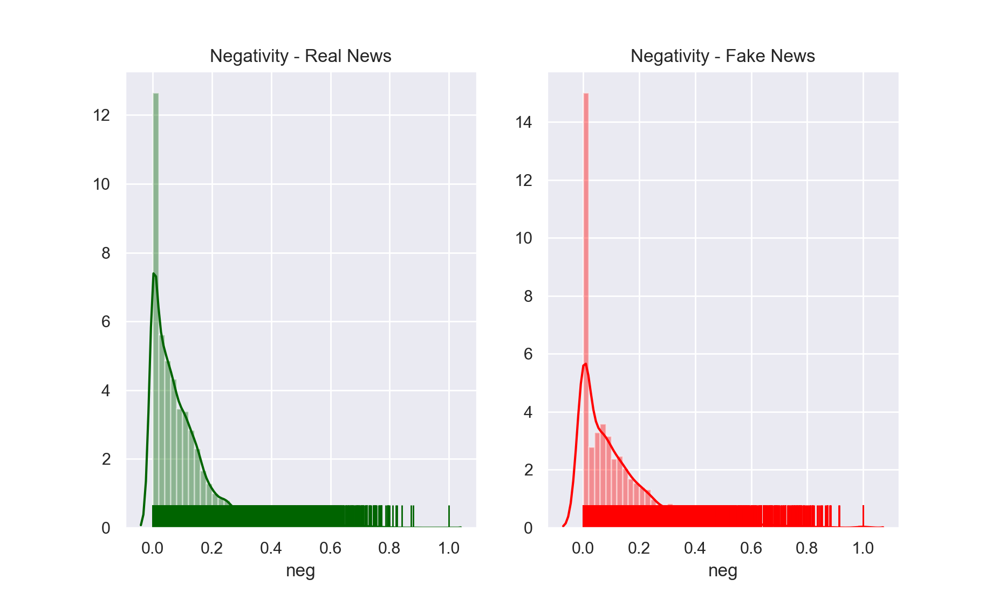

In [91]:
# real/fake nltk sentiment (vader)
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(tweet_data[tweet_data['target']=='real']['neg'], 
             ax = ax[0], color = "darkgreen", rug = True).set_title("Negativity - Real News")
sns.distplot(tweet_data[tweet_data['target']=='fake']['neg'],
             ax = ax[1], color = "red", rug = True).set_title("Negativity - Fake News");

<IPython.core.display.Javascript object>


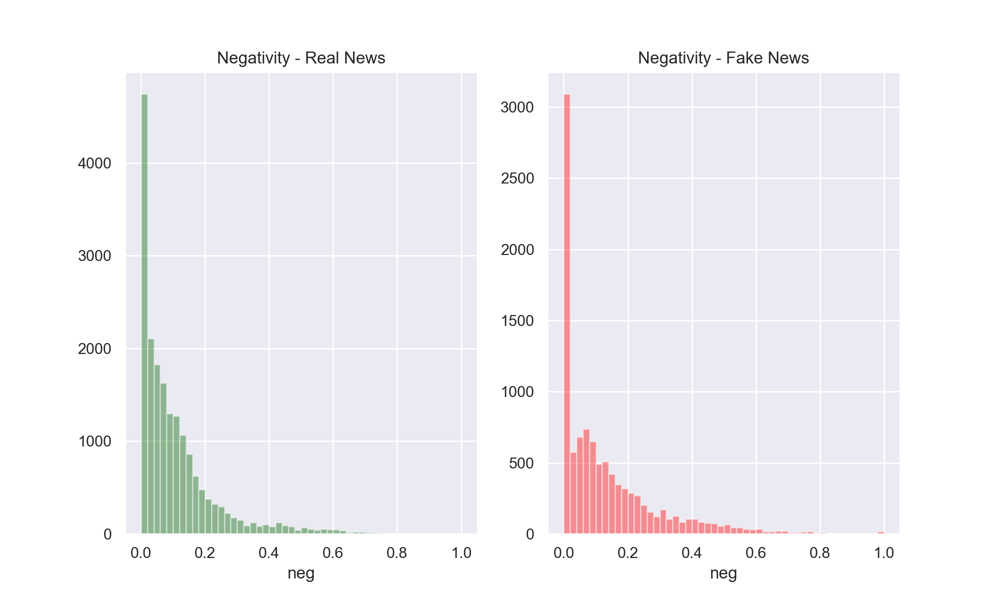

In [233]:
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(tweet_data[tweet_data['target']=='real']['neg'], 
             ax = ax[0], color = "darkgreen", kde=False).set_title("Negativity - Real News")
sns.distplot(tweet_data[tweet_data['target']=='fake']['neg'],
             ax = ax[1], color = "red", kde=False).set_title("Negativity - Fake News");

In [92]:
# simple sentiment analysis - textblob
tweet_data['polarity'] = tweet_data['clean_text2'].apply(lambda x:TextBlob(x).sentiment.polarity)
tweet_data.head()

,id,title,text,source,target,num_words,num_chars,source2,clean_text,clean_title,num_words_title,clean_text2,neg,neu,pos,compound,polarity
0,buzzfeed,Proof The Mainstream Media Is Manipulating The...,I woke up this morning to find a variation of ...,www.addictinginfo.org,fake,532,3218,www.addictinginfo.org,i woke up this morning to find a variation of ...,proof the mainstream media is manipulating the...,15,woke morning variation headline splashed news ...,0.104,0.672,0.224,0.9871,-0.014263
1,buzzfeed,Charity: Clinton Foundation Distributed “Water...,Former President Bill Clinton and his Clinton ...,eaglerising.com,fake,1348,8837,eaglerising.com,former president bill clinton and his clinton ...,charity clinton foundation distributed watered...,13,president clinton clinton health access initia...,0.113,0.734,0.153,0.9843,0.027718
2,buzzfeed,A Hillary Clinton Administration May be Entire...,After collapsing just before trying to step in...,eaglerising.com,fake,599,3471,eaglerising.com,after collapsing just before trying to step in...,a hillary clinton administration may be entire...,14,collapsing trying step van removed ceremony ne...,0.042,0.797,0.161,0.9774,0.061961
3,buzzfeed,Trump’s Latest Campaign Promise May Be His Mos...,"Donald Trump is, well, deplorable. He’s sugges...",www.addictinginfo.org,fake,738,4454,www.addictinginfo.org,donald trump is well deplorable hes suggested ...,trumps latest campaign promise may be his most...,11,donald trump deplorable hes suggested building...,0.343,0.550,0.107,-0.9990,-0.012736
4,buzzfeed,Website is Down For Maintenance,Website is Down For Maintenance,www.proudcons.com,fake,5,31,www.proudcons.com,website is down for maintenance,website is down for maintenance,5,website maintenance,0.000,1.000,0.000,0.0000,0.000000


In [93]:
# real news polarity stats
tweet_data[tweet_data['target']=='real']['polarity'].describe()

count    18748.000000
mean         0.112250
std          0.170290
min         -1.000000
25%          0.000000
50%          0.106664
75%          0.202145
max          1.000000
Name: polarity, dtype: float64

In [94]:
# fake news polarity stats
tweet_data[tweet_data['target']=='fake']['polarity'].describe()

count    10304.000000
mean         0.081757
std          0.211362
min         -1.000000
25%          0.000000
50%          0.056041
75%          0.170230
max          1.000000
Name: polarity, dtype: float64

<IPython.core.display.Javascript object>


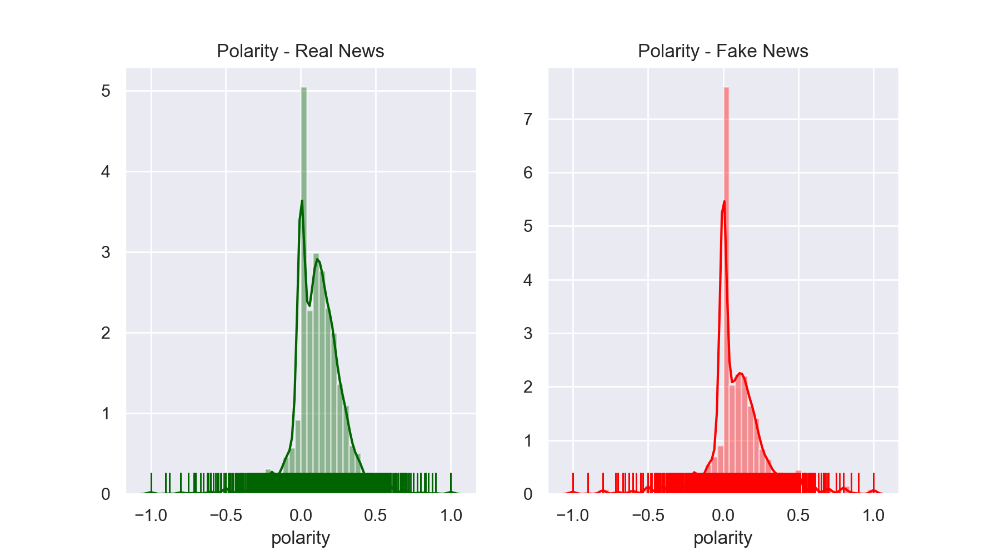

In [95]:
# polarity fake/real
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(tweet_data[tweet_data['target']=='real']['polarity'], 
             ax = ax[0], color = "darkgreen", rug = True).set_title("Polarity - Real News")
sns.distplot(tweet_data[tweet_data['target']=='fake']['polarity'],
             ax = ax[1], color = "red", rug = True).set_title("Polarity - Fake News");

In [96]:
# export dataframe - so reload next time
tweet_data.to_csv('tweet_data_with_sentiment2.csv') 

# tweet_data = pd.read_csv('tweet_data_with_sentiment2.csv')

In [190]:
# do on article title
tweet_data["clean_title2"] = tweet_data["clean_title"].apply(lambda x: ' '.join([word for word in x.split() if word not in (gensim_stop)]))
tweet_data.head()

,id,title,text,source,target,num_words,num_chars,source2,clean_text,clean_title,...,neg,neu,pos,compound,polarity,num_excl,num_excl_title,num_quote,num_quote_title,clean_title2
0,buzzfeed,Proof The Mainstream Media Is Manipulating The...,I woke up this morning to find a variation of ...,www.addictinginfo.org,fake,532,3218,www.addictinginfo.org,i woke up this morning to find a variation of ...,proof the mainstream media is manipulating the...,...,0.104,0.672,0.224,0.9871,-0.014263,0,0,0,0,proof mainstream media manipulating election t...
1,buzzfeed,Charity: Clinton Foundation Distributed “Water...,Former President Bill Clinton and his Clinton ...,eaglerising.com,fake,1348,8837,eaglerising.com,former president bill clinton and his clinton ...,charity clinton foundation distributed watered...,...,0.113,0.734,0.153,0.9843,0.027718,0,0,0,0,charity clinton foundation distributed watered...
2,buzzfeed,A Hillary Clinton Administration May be Entire...,After collapsing just before trying to step in...,eaglerising.com,fake,599,3471,eaglerising.com,after collapsing just before trying to step in...,a hillary clinton administration may be entire...,...,0.042,0.797,0.161,0.9774,0.061961,0,0,0,0,hillary clinton administration entirely run fi...
3,buzzfeed,Trump’s Latest Campaign Promise May Be His Mos...,"Donald Trump is, well, deplorable. He’s sugges...",www.addictinginfo.org,fake,738,4454,www.addictinginfo.org,donald trump is well deplorable hes suggested ...,trumps latest campaign promise may be his most...,...,0.343,0.550,0.107,-0.9990,-0.012736,0,0,0,0,trumps latest campaign promise horrible
4,buzzfeed,Website is Down For Maintenance,Website is Down For Maintenance,www.proudcons.com,fake,5,31,www.proudcons.com,website is down for maintenance,website is down for maintenance,...,0.000,1.000,0.000,0.0000,0.000000,0,0,0,0,website maintenance


In [193]:
# nltk - vader sentiment
analyzer2 = SentimentIntensityAnalyzer()

# get positive, negative, neutral, compound scores
tweet_data['neg1'] = tweet_data['clean_title2'].apply(lambda x:analyzer2.polarity_scores(x)['neg'])
tweet_data['neu1'] = tweet_data['clean_title2'].apply(lambda x:analyzer2.polarity_scores(x)['neu'])
tweet_data['pos1'] = tweet_data['clean_title2'].apply(lambda x:analyzer2.polarity_scores(x)['pos'])
tweet_data['compound1'] = tweet_data['clean_title2'].apply(lambda x:analyzer2.polarity_scores(x)['compound'])
tweet_data.head()

,id,title,text,source,target,num_words,num_chars,source2,clean_text,clean_title,...,polarity,num_excl,num_excl_title,num_quote,num_quote_title,clean_title2,neg1,neu1,pos1,compound1
0,buzzfeed,Proof The Mainstream Media Is Manipulating The...,I woke up this morning to find a variation of ...,www.addictinginfo.org,fake,532,3218,www.addictinginfo.org,i woke up this morning to find a variation of ...,proof the mainstream media is manipulating the...,...,-0.014263,0,0,0,0,proof mainstream media manipulating election t...,0.263,0.737,0.000,-0.3612
1,buzzfeed,Charity: Clinton Foundation Distributed “Water...,Former President Bill Clinton and his Clinton ...,eaglerising.com,fake,1348,8837,eaglerising.com,former president bill clinton and his clinton ...,charity clinton foundation distributed watered...,...,0.027718,0,0,0,0,charity clinton foundation distributed watered...,0.000,0.781,0.219,0.4215
2,buzzfeed,A Hillary Clinton Administration May be Entire...,After collapsing just before trying to step in...,eaglerising.com,fake,599,3471,eaglerising.com,after collapsing just before trying to step in...,a hillary clinton administration may be entire...,...,0.061961,0,0,0,0,hillary clinton administration entirely run fi...,0.000,1.000,0.000,0.0000
3,buzzfeed,Trump’s Latest Campaign Promise May Be His Mos...,"Donald Trump is, well, deplorable. He’s sugges...",www.addictinginfo.org,fake,738,4454,www.addictinginfo.org,donald trump is well deplorable hes suggested ...,trumps latest campaign promise may be his most...,...,-0.012736,0,0,0,0,trumps latest campaign promise horrible,0.398,0.341,0.261,-0.2960
4,buzzfeed,Website is Down For Maintenance,Website is Down For Maintenance,www.proudcons.com,fake,5,31,www.proudcons.com,website is down for maintenance,website is down for maintenance,...,0.000000,0,0,0,0,website maintenance,0.000,1.000,0.000,0.0000


In [194]:
print('Real average title negativity:', tweet_data[tweet_data['target']=='real']['neg1'].mean())
print('Fake average title negativity:', tweet_data[tweet_data['target']=='fake']['neg1'].mean())

print('Real average title positivity:', tweet_data[tweet_data['target']=='real']['pos1'].mean())
print('Fake average title positivity:', tweet_data[tweet_data['target']=='fake']['pos1'].mean())

# https://blog.quantinsti.com/vader-sentiment/ - negative/positive 
print('Real average title compound sentiment:', tweet_data[tweet_data['target']=='real']['compound1'].mean())
print('Fake average title compound sentiment:', tweet_data[tweet_data['target']=='fake']['compound1'].mean())

Real average title negativity: 0.07607195434179645
Fake average title negativity: 0.06879386645962733
Real average title positivity: 0.11744511414550884
Fake average title positivity: 0.06237140916149069
Real average title compound sentiment: 0.05424498613185407
Fake average title compound sentiment: -0.012015916149068323


<IPython.core.display.Javascript object>


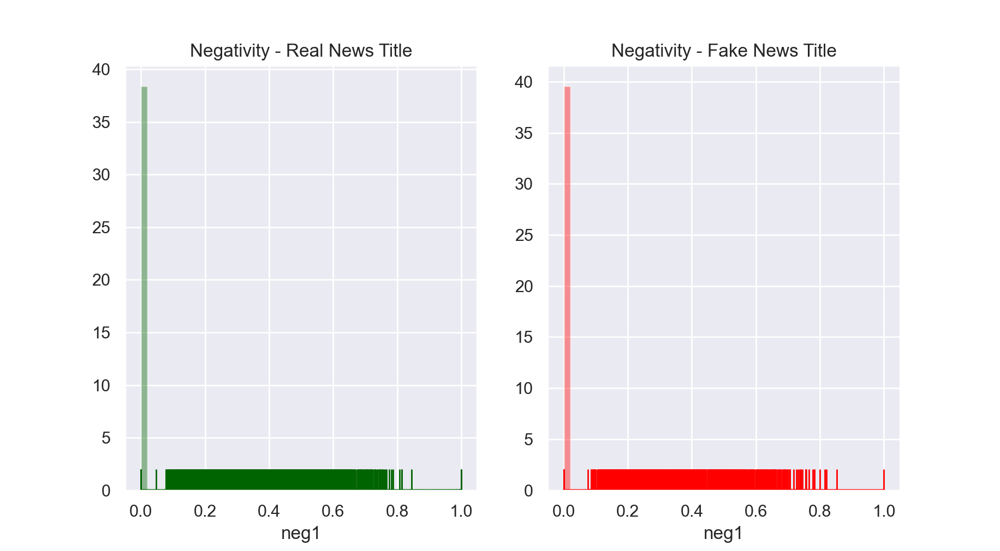

In [195]:
# real/fake nltk sentiment (vader) - title
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(tweet_data[tweet_data['target']=='real']['neg1'], 
             ax = ax[0], color = "darkgreen", rug = True).set_title("Negativity - Real News Title")
sns.distplot(tweet_data[tweet_data['target']=='fake']['neg1'],
             ax = ax[1], color = "red", rug = True).set_title("Negativity - Fake News Title");

In [196]:
# simple sentiment analysis - textblob - title
tweet_data['polarity1'] = tweet_data['clean_title2'].apply(lambda x:TextBlob(x).sentiment.polarity)
tweet_data.head()

,id,title,text,source,target,num_words,num_chars,source2,clean_text,clean_title,...,num_excl,num_excl_title,num_quote,num_quote_title,clean_title2,neg1,neu1,pos1,compound1,polarity1
0,buzzfeed,Proof The Mainstream Media Is Manipulating The...,I woke up this morning to find a variation of ...,www.addictinginfo.org,fake,532,3218,www.addictinginfo.org,i woke up this morning to find a variation of ...,proof the mainstream media is manipulating the...,...,0,0,0,0,proof mainstream media manipulating election t...,0.263,0.737,0.000,-0.3612,0.00
1,buzzfeed,Charity: Clinton Foundation Distributed “Water...,Former President Bill Clinton and his Clinton ...,eaglerising.com,fake,1348,8837,eaglerising.com,former president bill clinton and his clinton ...,charity clinton foundation distributed watered...,...,0,0,0,0,charity clinton foundation distributed watered...,0.000,0.781,0.219,0.4215,0.00
2,buzzfeed,A Hillary Clinton Administration May be Entire...,After collapsing just before trying to step in...,eaglerising.com,fake,599,3471,eaglerising.com,after collapsing just before trying to step in...,a hillary clinton administration may be entire...,...,0,0,0,0,hillary clinton administration entirely run fi...,0.000,1.000,0.000,0.0000,0.00
3,buzzfeed,Trump’s Latest Campaign Promise May Be His Mos...,"Donald Trump is, well, deplorable. He’s sugges...",www.addictinginfo.org,fake,738,4454,www.addictinginfo.org,donald trump is well deplorable hes suggested ...,trumps latest campaign promise may be his most...,...,0,0,0,0,trumps latest campaign promise horrible,0.398,0.341,0.261,-0.2960,-0.25
4,buzzfeed,Website is Down For Maintenance,Website is Down For Maintenance,www.proudcons.com,fake,5,31,www.proudcons.com,website is down for maintenance,website is down for maintenance,...,0,0,0,0,website maintenance,0.000,1.000,0.000,0.0000,0.00


<IPython.core.display.Javascript object>


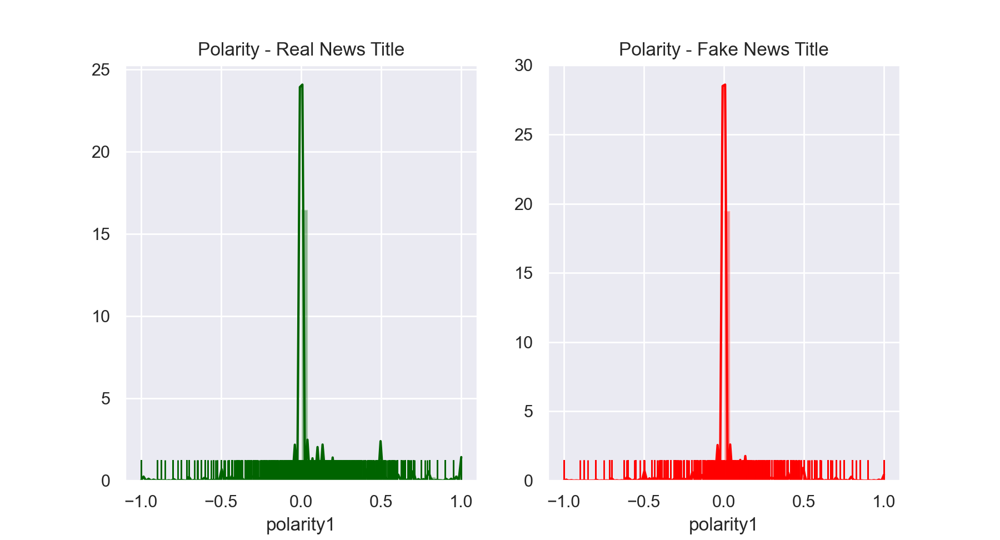

In [197]:
# polarity fake/real - title
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(tweet_data[tweet_data['target']=='real']['polarity1'], 
             ax = ax[0], color = "darkgreen", rug = True).set_title("Polarity - Real News Title")
sns.distplot(tweet_data[tweet_data['target']=='fake']['polarity1'],
             ax = ax[1], color = "red", rug = True).set_title("Polarity - Fake News Title");

In [198]:
tweet_data.groupby(['target'])[['pos1', 'neg1', 'neu1','compound1', 'polarity1']].mean()

,pos1,neg1,neu1,compound1,polarity1
target,,,,,
fake,0.062371,0.068794,0.439490,-0.012016,0.015570
real,0.117445,0.076072,0.631533,0.054245,0.057494
